# EDA-Project 3

Это ваш третий проект из второго блока курса Data Science. 
Вам предоставляется следующий файл: ```"netflix_titles.csv"```.

Сделайте EDA по данным. 
Перечислите вопросы, которые вы считаете важными. Затем попробуйте ответить на каждый вопрос, с визуализации. Пожалуйста, сделайте ваш код чистым, а аргументы понятными.


***
Для выполнения задания требуется визуальный осмотр данных. После этого будет составлен список предполагаемых вопросов.


## **1. Исходные данные**

### 1.1. Блок импорта

In [1]:
from pandas import set_option, concat, read_csv
from datetime import datetime

# пользовательский модуль с функциями рисования
from src.plotter import *

# данная строка закомментирована специально
# %matplotlib inline

In [2]:
# отображение целиком DataFrame на экране
set_option('display.max_columns', None)
set_option('display.expand_frame_repr', False)

# создание каталога для сохранения результатов обработки
mkdirs(root='./data')

### 1.2. Загрузка данных

In [3]:
# загрузка первичных данных из файла
df_data = load_file(file='./netflix_titles.csv')

### 1.3. Таблица исходных данных

In [4]:
df_data = df_data.sort_values(by="show_id", ascending=True)
df_data.reset_index(inplace=True)
df_data

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,247747,Movie,Amar Akbar Anthony,Manmohan Desai,"Vinod Khanna, Rishi Kapoor, Amitabh Bachchan, ...",India,"December 31, 2019",1977,TV-14,172 min,"Action & Adventure, Classic Movies, Comedies","Abandoned in a park by their father, Amar, Akb..."
1,269880,Movie,Bad Boys,Michael Bay,"Will Smith, Martin Lawrence, Téa Leoni, Tchéky...",United States,"October 1, 2019",1995,R,119 min,"Action & Adventure, Comedies","In this fast-paced actioner, two Miami narcoti..."
2,281550,Movie,La Bamba,Luis Valdez,"Lou Diamond Phillips, Esai Morales, Rosanna De...",United States,"January 1, 2020",1987,PG-13,109 min,"Classic Movies, Dramas, Music & Musicals",The plane crash that killed Buddy Holly also t...
3,284890,Movie,Barsaat,Rajkumar Santoshi,"Twinkle Khanna, Bobby Deol, Danny Denzongpa, R...",India,"April 1, 2018",1995,TV-PG,166 min,"Action & Adventure, International Movies, Musi...",A naïve young man and a rich city girl fall in...
4,292118,Movie,Beavis and Butt-head Do America,Mike Judge,"Mike Judge, Bruce Willis, Demi Moore, Cloris L...",United States,"November 20, 2019",1996,PG-13,81 min,"Comedies, Cult Movies","After realizing that their boob tube is gone, ..."
...,...,...,...,...,...,...,...,...,...,...,...,...
6229,81224868,TV Show,Robot Trains,NaN,"Bill Rogers, Carrie Savage, Ken Spassione, Ang...",South Korea,"December 31, 2019",2018,TV-Y7,2 Seasons,"Kids' TV, Korean TV Shows",Keeping peace and safety in Train World is no ...
6230,81227195,Movie,Kalushi: The Story of Solomon Mahlangu,Mandla Dube,"Thabo Rametsi, Thabo Malema, Welile Nzuza, Jaf...",South Africa,"November 29, 2019",2016,TV-MA,107 min,"Dramas, International Movies",The life and times of iconic South African lib...
6231,81228864,Movie,Blitz Patrollie,Andrew Wessels,"Joey Rasdien, David Kau, David Kibuuka, Chris ...",South Africa,"December 27, 2019",2013,TV-MA,102 min,"Action & Adventure, Comedies, International Mo...",Caught between family pressures and small-time...
6232,81235603,TV Show,Sym-Bionic Titan,NaN,"Tara Strong, Kevin Thoms, Brian Posehn, John D...",United States,"December 15, 2019",2010,TV-PG,1 Season,Kids' TV,"Aliens fleeing their planet land on Earth, pos..."


# **2. ВОПРОСЫ И ПЛАН ДЕЙСТВИЙ**

## **2.1** <span style="color: blue;">**ЧТО МОЖНО СДЕЛАТЬ С ДАННЫМИ**</span>

```    
1. Получить статистические данные по каждому параметру, имеющему отношение к фильму:

    1.1. max;
    1.2. mean;
    1.3. median;
    1.4. min,
    1.5. std.

2. Так как основные данные по фильмам не имеют цифрового представления или возможности полностью провести приведение строковых значений к цифровым аналогам, то построить полноценную матрицу корреляции не представляется возможным. Поэтому для таких параметров можно построить статистические графики фильмотеки:

    2.1. зависимостями внутри каждой группы по отношению к каждому из параметров и;
    2.2. выделить лидеров как по наивысшим показателям отношению к фильмам, так и по наименьшим.

3. Построить графики:

    3.1. Долевая статистика категорий.
    3.2. Количественные графики в каждой категории по долям участия (показа или создания фильма).

3.3. Данные, содержащие отсутствующие параметры.

4. Сделать выводы на основе анализа данных.
```


***
## **2.2.** <span style="color: green;">**ЧТО НУЖНО СДЕЛАТЬ С ДАННЫМИ**</span>

```    
1. Визуально проверить исходный файл 'scv' с данными на:

    1.1. Общую информацию о данных. 
    1.2. наличие аномалий, которые могут повлиять на обработку:
        1.2.1. пустые значения,
        1.2.2. наличие символов в данных,
        1.2.3. другое.

2. Загрузить данные в DataFrame.

3. Проверить данные на аномалии, не замеченные в пункт 1.2.

4. Первичный статистический разбор:

    4.1. Типы данных,
    4.2. Уникальные значения,
    4.3. Пустые значения,
    
5. Приведение типов с добавлением в таблицу:

    5.1. строковые в цифры,
    5.2. даты 'date_added' на составляющие (год, месяц, день, название дня),
    5.3. анализ составных данных:
        5.3.1. 'director',
        5.3.2. 'cast',
        5.3.3. 'country' (есть несколько стран),
        5.3.4. понять структуру столбца 'Duration' (есть данные не только в минутах, а в 'Season'),
        5.3.5. то же в 'listed_in'.

6. Основной статистический разбор (по возможности):
    
    6.1. Определение агрегаторов,
    6.2. Построение матрицы корреляции,
    6.3. либо выявление зависимости между параметрами в графическом виде.

7. Построение графиков.

8. Выводы на основе анализа данных.

```

# **3. СБОР ДАННЫХ**

## 3.1. Статистическая информация по исходным данным

### 3.1.1. Просмотр типов данных

Результат осмотра показывает, что за исключением одного, все столбцы имеют не цифровые значения и типы данных. Для построения матрицы корреляции и графиков потребуется перевести все необходимые типы данных к цифровому формату.

In [5]:
df_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6234 entries, 0 to 6233
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       6234 non-null   int64 
 1   type          6234 non-null   object
 2   title         6234 non-null   object
 3   director      4265 non-null   object
 4   cast          5664 non-null   object
 5   country       5758 non-null   object
 6   date_added    6223 non-null   object
 7   release_year  6234 non-null   int64 
 8   rating        6224 non-null   object
 9   duration      6234 non-null   object
 10  listed_in     6234 non-null   object
 11  description   6234 non-null   object
dtypes: int64(2), object(10)
memory usage: 584.6+ KB


### 3.1.2. Уникальные значения

In [6]:
df_data.value_counts()

show_id   type   title                                     director            cast                                                                                                                                                                                                      country                                                  date_added         release_year  rating  duration  listed_in                                         description                                                                                                                                                                                                        
247747    Movie  Amar Akbar Anthony                        Manmohan Desai      Vinod Khanna, Rishi Kapoor, Amitabh Bachchan, Neetu Singh, Parveen Babi, Shabana Azmi, Nirupa Roy, Pran                                                                                                   India                                                    December 31

### 3.1.3. Определение пустых значений
Есть 5 категорий с пустыми значениями.

In [7]:
# Определение пустых значений
df_data.isnull().sum()

show_id            0
type               0
title              0
director        1969
cast             570
country          476
date_added        11
release_year       0
rating            10
duration           0
listed_in          0
description        0
dtype: int64

#### 3.1.4. Общая Статистика уникальных значений

Таблица неполная, поэтому требуется дальнейшая обработка данных. Большое значение 'std' говорит о большом разбросе данных.

In [8]:
df_data.describe()

,show_id,release_year
count,6.234000e+03,6234.00000
mean,7.670368e+07,2013.35932
std,1.094296e+07,8.81162
min,2.477470e+05,1925.00000
25%,8.003580e+07,2013.00000
50%,8.016337e+07,2016.00000
75%,8.024489e+07,2018.00000
max,8.123573e+07,2020.00000


## **4. ОБРАБОТКА ДАННЫХ**

In [9]:
# копия исходных данных
df_MOVIE = df_data.copy()

In [10]:
# информация о данных
df_MOVIE.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6234 entries, 0 to 6233
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       6234 non-null   int64 
 1   type          6234 non-null   object
 2   title         6234 non-null   object
 3   director      4265 non-null   object
 4   cast          5664 non-null   object
 5   country       5758 non-null   object
 6   date_added    6223 non-null   object
 7   release_year  6234 non-null   int64 
 8   rating        6224 non-null   object
 9   duration      6234 non-null   object
 10  listed_in     6234 non-null   object
 11  description   6234 non-null   object
dtypes: int64(2), object(10)
memory usage: 584.6+ KB


### 4.1. Предварительное изучение данных колонок

Осмотр не даёт полного представления о содержании ячеек, но не выявляет мусорных данных. Есть вопросы к колонкам `'country'`, `'duration'`, `'director'`, `'cast'` которые будут разобраны далее.

In [11]:
# список колонок
column_list = df_MOVIE.columns.to_list()
column_list

['show_id',
 'type',
 'title',
 'director',
 'cast',
 'country',
 'date_added',
 'release_year',
 'rating',
 'duration',
 'listed_in',
 'description']

In [12]:
# все уникальные значения
for val in column_list:
    print(val)
    print(df_MOVIE[val].unique(), end="\n" + "="*100 + "\n")

show_id
[  247747   269880   281550 ... 81228864 81235603 81235729]
type
['Movie' 'TV Show']
title
['Amar Akbar Anthony' 'Bad Boys' 'La Bamba' ... 'Blitz Patrollie'
 'Sym-Bionic Titan' 'Jezebel']
director
['Manmohan Desai' 'Michael Bay' 'Luis Valdez' ... 'Mandla Dube'
 'Andrew Wessels' 'Numa Perrier']
cast
['Vinod Khanna, Rishi Kapoor, Amitabh Bachchan, Neetu Singh, Parveen Babi, Shabana Azmi, Nirupa Roy, Pran'
 'Will Smith, Martin Lawrence, Téa Leoni, Tchéky Karyo, Theresa Randle, Joe Pantoliano, Emmanuel Xuereb, Michael Imperioli, Nestor Serrano, Julio Oscar Mechoso'
 'Lou Diamond Phillips, Esai Morales, Rosanna DeSoto, Elizabeth Peña, Danielle von Zerneck, Joe Pantoliano, Rick Dees, Marshall Crenshaw, Howard Huntsberry, Brian Setzer'
 ...
 'Joey Rasdien, David Kau, David Kibuuka, Chris Forrest, Santhiran Moonsamy, Quentin Krog, Kaseran Pillay, Mabutho Sithole, Mel Miller, Kagiso Lediga, Craig Urbani'
 'Tara Strong, Kevin Thoms, Brian Posehn, John DiMaggio, Tim Russ, Don Leslie, Kari

### 4.2. Проверка и Выборка всех строк, содержащих значения, которые нельзя перевести в цифровой тип

In [13]:
df_MOVIE['country'].value_counts()

United States                                2032
India                                         777
United Kingdom                                348
Japan                                         176
Canada                                        141
                                             ... 
India, United Kingdom                           1
United States, Russia                           1
United Kingdom, Jordan, Qatar, Iran             1
United Arab Emirates, Jordan                    1
South Korea, Canada, United States, China       1
Name: country, Length: 554, dtype: int64

In [14]:
df_MOVIE['rating'].value_counts()

TV-MA       2027
TV-14       1698
TV-PG        701
R            508
PG-13        286
NR           218
PG           184
TV-Y7        169
TV-G         149
TV-Y         143
TV-Y7-FV      95
G             37
UR             7
NC-17          2
Name: rating, dtype: int64

#### 4.3. Подготовка к определению данных для выноса в отдельные столбцы

#### 4.3.1. Анализ данных по столбцу `'duration'` показывает, что его значения делятся на 2 вида: `время в минутах` и `разбивка по сезонам`. Это даёт возможность разбить данные столбца `'duration'` на несколько столбцов:

1. `'duration'` время в минутах,
2. разделение на ``seasons`` (*`да=1`/ `нет=0`*),
3. отдельный столбец номер сезона `'season'`.

Нет однозначного понимания уникальных значений в колонке, поэтому нужна дополнительная обработка данных с выявлением особенностей. Для этого написана функция.

In [15]:
df_MOVIE['duration'].unique()

array(['172 min', '119 min', '109 min', '166 min', '81 min', '86 min',
       '99 min', '98 min', '87 min', '146 min', '89 min', '101 min',
       '102 min', '93 min', '200 min', '85 min', '133 min', '103 min',
       '91 min', '84 min', '118 min', '112 min', '115 min', '110 min',
       '116 min', '114 min', '105 min', '94 min', '153 min', '92 min',
       '138 min', '117 min', '141 min', '126 min', '131 min', '154 min',
       '79 min', '120 min', '135 min', '106 min', '100 min', '128 min',
       '113 min', '108 min', '127 min', '90 min', '129 min', '96 min',
       '139 min', '121 min', '136 min', '124 min', '95 min', '104 min',
       '83 min', '177 min', '111 min', '170 min', '82 min', '192 min',
       '163 min', '148 min', '158 min', '160 min', '161 min', '173 min',
       '156 min', '137 min', '69 min', '130 min', '142 min', '122 min',
       '189 min', '159 min', '88 min', '97 min', '123 min', '181 min',
       '125 min', '149 min', '228 min', '178 min', '75 min', '50 min',
 

#### 4.3.2. Получение аномальных и уникальных значений для построения колонок

In [16]:
false_list, uniqe_list, other_list, minutes_list = get_unique_val(df_data=df_MOVIE, column_name='duration', condition='min')

In [17]:
# 'duration' минуты
false_list

{True}

#### 4.3.3. Других аномальных значений в составе 'duration' не найдено

In [18]:
# 'duration' не минуты
uniqe_list

['Season', 'Seasons']

In [19]:
# ОТЛАДКА. Проверочный список со временем в минутах
print(minutes_list)

['90 min', '91 min', '92 min', '95 min', '94 min', '93 min', '99 min', '97 min', '88 min', '96 min', '98 min', '100 min', '89 min', '86 min', '103 min', '102 min', '101 min', '105 min', '87 min', '106 min', '110 min', '104 min', '107 min', '108 min', '84 min', '109 min', '85 min', '116 min', '83 min', '119 min', '81 min', '118 min', '111 min', '112 min', '117 min', '113 min', '78 min', '82 min', '121 min', '127 min', '124 min', '126 min', '137 min', '122 min', '128 min', '114 min', '80 min', '123 min', '120 min', '79 min', '115 min', '125 min', '130 min', '135 min', '75 min', '74 min', '133 min', '132 min', '66 min', '63 min', '77 min', '53 min', '131 min', '69 min', '60 min', '73 min', '129 min', '61 min', '65 min', '72 min', '54 min', '62 min', '59 min', '71 min', '58 min', '134 min', '70 min', '24 min', '140 min', '52 min', '76 min', '67 min', '46 min', '68 min', '141 min', '143 min', '44 min', '136 min', '150 min', '64 min', '22 min', '148 min', '55 min', '151 min', '40 min', '139 

In [20]:
# Проверочный список значений не в минутах
other_list

['1 Season',
 '2 Seasons',
 '3 Seasons',
 '4 Seasons',
 '5 Seasons',
 '6 Seasons',
 '7 Seasons',
 '8 Seasons',
 '9 Seasons',
 '10 Seasons',
 '11 Seasons',
 '13 Seasons',
 '15 Seasons',
 '12 Seasons',
 '14 Seasons']

In [21]:
# год выпуска
df_MOVIE['release_year'].unique()

array([1977, 1995, 1987, 1996, 1974, 1992, 1976, 1988, 1968, 1973, 1994,
       1982, 1965, 1981, 1986, 1956, 1993, 1958, 1991, 1979, 1962, 1975,
       1984, 1985, 1946, 1990, 1969, 1997, 1998, 1989, 1978, 1999, 1972,
       2000, 1960, 2001, 1964, 1954, 2002, 2003, 1971, 1942, 1980, 2004,
       2005, 1967, 1943, 2006, 1955, 2013, 2007, 1983, 2008, 2009, 2010,
       2011, 2012, 2014, 2019, 2018, 2015, 2017, 2016, 1963, 2020, 1945,
       1944, 1947, 1966, 1959, 1925, 1970], dtype=int64)

In [22]:
df_MOVIE['date_added'].unique()

array(['December 31, 2019', 'October 1, 2019', 'January 1, 2020', ...,
       ' November 4, 2019', ' November 26, 2019', 'January 11, 2020'],
      dtype=object)

#### 4.4. МАНИПУЛЯЦИИ СО СТОЛБЦАМИ

In [23]:
# УДАЛЕНИЕ НЕНУЖНЫХ СТОЛБЦОВ ДЛЯ АНАЛИТИКИ
df_MOVIE = df_MOVIE.drop(columns="description")


# ДОБАВЛЕНИЕ НОВЫХ СТОЛБЦОВ
# удаление пропущенных пробелов по краям
df_MOVIE["date_added"] = df_MOVIE["date_added"].dropna().apply(lambda x: str(x).strip())

# номер колонки для вставки
def get_colindex(column_namme:str) -> int:
    return df_MOVIE.columns.get_loc(key=column_namme) + 1
    

# вставка столбцов в таблицу
# для дат
for val in ["year_added", "month_added", "day_added", "weekday_added"]:
    column_index = get_colindex(column_namme='date_added')
    df_MOVIE.insert(loc=column_index, column=val, value="")
    column_index += 1

# количество
# для людей и стран
for val in ["director", "cast", "country", "listed_in"]:
    newcolname = val + "_num"
    df_MOVIE.insert(loc=get_colindex(val), column=newcolname.lower(), value="")
    # применяется форматирование для 'float' без дробной части
    df_MOVIE[newcolname] = df_MOVIE[val].dropna().apply(lambda x: '{:.0f}'.format(len(x.split(","))))

# заполнение данными дат
df_MOVIE["year_added"]    = df_MOVIE["date_added"].dropna().apply(lambda x: '{:.0f}'.format(datetime.strptime(x,"%B %d, %Y").year))
df_MOVIE["month_added"]   = df_MOVIE["date_added"].dropna().apply(lambda x: '{:.0f}'.format(datetime.strptime(x,"%B %d, %Y").month))
df_MOVIE["day_added"]     = df_MOVIE["date_added"].dropna().apply(lambda x: '{:.0f}'.format(datetime.strptime(x,"%B %d, %Y").day))
df_MOVIE["weekday_added"] = df_MOVIE["date_added"].dropna().apply(lambda x: datetime.strftime(datetime.strptime(x,"%B %d, %Y"), "%A"))

# # создание новых столбцов
for val in ['serial', 'season']:
    df_MOVIE.insert(loc=get_colindex('duration'), column=val, value="")

# serial
df_MOVIE['serial'] = df_MOVIE['duration'].apply(lambda x: get_season_x(x))
# seasons
df_MOVIE['season'] = df_MOVIE['duration'].apply(lambda x: get_season_x(x,True))

# функция обработки 'duration'
def duration_replace(x):
    # проверка на число после удаления по условию
    if isNumkey(key=x, condition='min', isValue=False):
        # удаление лишнего
        return isNumkey(key=x, condition='min', isValue=True)
    # если есть что-то кроме числа создаются столбцы
    # else:
    #     # замена на 'NaN'
    #     x = np.nan

# приведение к числам где можно
df_MOVIE["duration"] = df_MOVIE["duration"].apply(lambda x: duration_replace(x))


# количество
# БУДЕТ ЗАПОЛНЯТЬСЯ ОЧЕНЬ ДОЛГО, ЧТО НЕОПРАВДАНО
# df_MOVIE["directors_number"] = df_MOVIE["director"].dropna().apply(lambda x: len[x.split(",")])
# df_MOVIE["actors_number"]    = df_MOVIE["cast"].dropna().apply(lambda x: len[x.split(",")])
# df_MOVIE["country_number"]    = df_MOVIE["country"].dropna().apply(lambda x: len[x.split(",")])


# # сохранение данных
df_MOVIE.to_excel('./data/netflix_titles_cleared.xlsx')
print("файл './data/netflix_titles_cleared.xlsx' сохранён")
df_MOVIE.to_csv('./data/netflix_titles_cleared.csv')
print("файл './data/netflix_titles_cleared.csv' сохранён")
df_MOVIE.sort_values(by="show_id", ascending=True)
# данные для построения графика
df_PAIR = df_MOVIE.copy()
df_MOVIE


файл './data/netflix_titles_cleared.xlsx' сохранён
файл './data/netflix_titles_cleared.csv' сохранён


,show_id,type,title,director,director_num,cast,cast_num,country,country_num,date_added,weekday_added,day_added,month_added,year_added,release_year,rating,duration,season,serial,listed_in,listed_in_num
0,247747,Movie,Amar Akbar Anthony,Manmohan Desai,1,"Vinod Khanna, Rishi Kapoor, Amitabh Bachchan, ...",8,India,1,"December 31, 2019",Tuesday,31,12,2019,1977,TV-14,172,0,0,"Action & Adventure, Classic Movies, Comedies",3
1,269880,Movie,Bad Boys,Michael Bay,1,"Will Smith, Martin Lawrence, Téa Leoni, Tchéky...",10,United States,1,"October 1, 2019",Tuesday,1,10,2019,1995,R,119,0,0,"Action & Adventure, Comedies",2
2,281550,Movie,La Bamba,Luis Valdez,1,"Lou Diamond Phillips, Esai Morales, Rosanna De...",10,United States,1,"January 1, 2020",Wednesday,1,1,2020,1987,PG-13,109,0,0,"Classic Movies, Dramas, Music & Musicals",3
3,284890,Movie,Barsaat,Rajkumar Santoshi,1,"Twinkle Khanna, Bobby Deol, Danny Denzongpa, R...",7,India,1,"April 1, 2018",Sunday,1,4,2018,1995,TV-PG,166,0,0,"Action & Adventure, International Movies, Musi...",3
4,292118,Movie,Beavis and Butt-head Do America,Mike Judge,1,"Mike Judge, Bruce Willis, Demi Moore, Cloris L...",11,United States,1,"November 20, 2019",Wednesday,20,11,2019,1996,PG-13,81,0,0,"Comedies, Cult Movies",2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6229,81224868,TV Show,Robot Trains,NaN,NaN,"Bill Rogers, Carrie Savage, Ken Spassione, Ang...",8,South Korea,1,"December 31, 2019",Tuesday,31,12,2019,2018,TV-Y7,None,2,1,"Kids' TV, Korean TV Shows",2
6230,81227195,Movie,Kalushi: The Story of Solomon Mahlangu,Mandla Dube,1,"Thabo Rametsi, Thabo Malema, Welile Nzuza, Jaf...",6,South Africa,1,"November 29, 2019",Friday,29,11,2019,2016,TV-MA,107,0,0,"Dramas, International Movies",2
6231,81228864,Movie,Blitz Patrollie,Andrew Wessels,1,"Joey Rasdien, David Kau, David Kibuuka, Chris ...",11,South Africa,1,"December 27, 2019",Friday,27,12,2019,2013,TV-MA,102,0,0,"Action & Adventure, Comedies, International Mo...",3
6232,81235603,TV Show,Sym-Bionic Titan,NaN,NaN,"Tara Strong, Kevin Thoms, Brian Posehn, John D...",7,United States,1,"December 15, 2019",Sunday,15,12,2019,2010,TV-PG,None,1,1,Kids' TV,1


In [24]:
# проверка
df_MOVIE.loc[:,'country':'rating']

,country,country_num,date_added,weekday_added,day_added,month_added,year_added,release_year,rating
0,India,1,"December 31, 2019",Tuesday,31,12,2019,1977,TV-14
1,United States,1,"October 1, 2019",Tuesday,1,10,2019,1995,R
2,United States,1,"January 1, 2020",Wednesday,1,1,2020,1987,PG-13
3,India,1,"April 1, 2018",Sunday,1,4,2018,1995,TV-PG
4,United States,1,"November 20, 2019",Wednesday,20,11,2019,1996,PG-13
...,...,...,...,...,...,...,...,...,...
6229,South Korea,1,"December 31, 2019",Tuesday,31,12,2019,2018,TV-Y7
6230,South Africa,1,"November 29, 2019",Friday,29,11,2019,2016,TV-MA
6231,South Africa,1,"December 27, 2019",Friday,27,12,2019,2013,TV-MA
6232,United States,1,"December 15, 2019",Sunday,15,12,2019,2010,TV-PG


### **5. Корреляция**

#### 5.1. Коэффициенты корреляции

In [25]:
# корреляция
df_CORR = df_MOVIE.corr(numeric_only=True)
df_CORR

,show_id,release_year,season,serial
show_id,1.000000,0.566577,0.043615,0.145630
release_year,0.566577,1.000000,0.092948,0.167880
season,0.043615,0.092948,1.000000,0.671452
serial,0.145630,0.167880,0.671452,1.000000


#### **5.2. СВОДНАЯ ТАБЛИЦА КОРРЕЛЯЦИОННОГО КОЭФФИЦИЕНТА ДЛЯ СОСТАВЛЯЮЩИХ АРЕНДНОЙ ПЛАТЫ**

Первые строки выделяют максимальные возможные влияния параметров. Конец таблицы показывает наименьшие взаимные влияния.

При дальнейшем графическом анализе данных будут учитываться первые три пары с наивысшей корреляцией.

Наивысшую корреляционную зависимость проявляет пара `'season vs serial'`.

In [26]:
# 3. СВОДНАЯ ТАБЛИЦА КОРРЕЛЯЦИОННОГО КОЭФФИЦИЕНТА ДЛЯ ПАРАМЕТРОВ
df_FULLCORR = get_minmaxcorr(df_corr=df_CORR, quantity=0)
# сохранение данных в файлы
df_FULLCORR.to_csv('./data/corr_pairs.csv')
print("файл './data/corr_pairs.csv' сохранён")
df_FULLCORR

файл './data/corr_pairs.csv' сохранён


,row_name,col_name
coef,,
0.671452,serial,season
0.566577,release_year,show_id
0.167880,serial,release_year
0.145630,serial,show_id
0.092948,season,release_year
0.043615,season,show_id


#### **5.3.Сводная таблица агрегаторов**

Максимальная корреляция по отношению сравниваемой величины к самой себе всегда составляет 1. Поэтому нет необходимости вносить её в результирующую таблицу.

Сводная таблица отсортирована по значению '`std`'.

In [27]:
# результирующая таблица агрегаторов корреляции
df_CORR_AGGREGTORS = concat([
                             df_CORR.mean(),
                             df_CORR.min(),
                             df_CORR.std(),
                             ],
                             keys=['mean','min','std'],  # выборка столбцов, без 'max = 1'
                            sort=False,                  # сортировка по названиям валют
                             axis=1)

# сортировка по наибольшему стандартному отклонению 'std'
df_CORR_AGGREGTORS = df_CORR_AGGREGTORS.sort_values(by="std", ascending=False)
df_CORR_AGGREGTORS

,mean,min,std
season,0.452004,0.043615,0.463379
show_id,0.438956,0.043615,0.437185
release_year,0.456851,0.092948,0.417525
serial,0.496241,0.145630,0.414416


In [28]:
# median
np.median(df_CORR_AGGREGTORS)

0.42735472417900255

#### **5.4. Статистика по стандартному отклонению 'std'**

Все отклонения в рассматриваемых группах имеют умеренный характер. Среди них нет лидеров, различия в сотых долях.

In [29]:
# статистика по стандартному отклонению
df_CORR_AGGREGTORS['std'].describe()

count    4.000000
mean     0.433126
std      0.022548
min      0.414416
25%      0.416747
50%      0.427355
75%      0.443733
max      0.463379
Name: std, dtype: float64

### **6. ПОЛУЧЕНИЕ УНИКАЛЬНЫХ ЗНАЧЕНИЙ ИМЁН**

### 6.1. ПОЛУЧЕНИЕ ИНФОРМАЦИИ ПО ГРУППАМ (ИЗ СТОЛБЦОВ)

Примечание. Была сделана неудачная попытка обработки данных внутри ячеек `'director', 'cast', 'country'` с анализом составных данных (имён и стран), с добавлением столбцов. После этого размер таблицы вырос до `(6234, 31194)`. Обработка данных таких размеров не комфортна через работу с файлами 'csv'. Для таких целей подходят БД SQL формата. Заполнение файла или 'DatFrame' нужной информацией занимает продолжительное время. Это неоправдано при увеличении количества строк в исходном файле 'csv'. По этой причине от такого разбиения данных пришлось отказаться.

In [30]:
# ПОЛУЧЕНИЕ ИНФОРМАЦИИ ПО ГРУППАМ (ИЗ СТОЛБЦОВ)
directors_list, directors_count_list, directors_index_dict, directors_dict = get_separated_cellvalues(column_name='director', df_data=df_MOVIE)
print(f"Количество режиссёров '{len(directors_list)}'")

actors_list, actors_count_list, actors_index_dict, actors_dict = get_separated_cellvalues(column_name='cast', df_data=df_MOVIE)
print(f"Количество актёров '{len(actors_list)}'")

country_list, country_count_list, country_index_dict, country_dict = get_separated_cellvalues(column_name='country', df_data=df_MOVIE)
print(f"Количество стран '{len(country_list)}'")

listed_in_list, listed_count_list, listed_index_dict, listed_dict = get_separated_cellvalues(column_name='listed_in', df_data=df_MOVIE)
print(f"Количество каналов '{len(listed_in_list)}'")

Количество режиссёров '3656'
Количество актёров '27406'
Количество стран '111'
Количество каналов '42'


<span style="color: orange;">ОТЛАДКА</span>

In [31]:
print(directors_list)

['A. L. Vijay', 'A. Salaam', 'A.R. Murugadoss', 'Aadish Keluskar', 'Aamir Bashir', 'Aamir Khan', 'Aanand Rai', 'Aaron Burns', 'Aaron Hancox', 'Aaron Hann', 'Aaron Moorhead', 'Aaron Nee', 'Aaron Woolf', 'Aatmaram Dharne', 'Abba T. Makama', 'Abbas Alibhai Burmawalla', 'Abbas Tyrewala', 'Abby Epstein', 'Abdellatif Kechiche', 'Abdul Aziz Hashad', 'Abdullah Al Noor', 'Abel Ferrara', 'Abhay Chopra', 'Abhijit Kokate', 'Abhinav Shiv Tiwari', 'Abhinay Deo', 'Abhishek Chaubey', 'Abhishek Kapoor', 'Abhishek Saxena', 'Abhishek Sharma', 'Abhishek Varman', 'Abu Bakr Shawky', 'Adam Alleca', 'Adam Bhala Lough', 'Adam Carolla', 'Adam Collins', 'Adam Darke', 'Adam Davis', 'Adam Del Giudice', 'Adam Deyoe', 'Adam Dubin', 'Adam Egypt Mortimer', 'Adam Larson Broder', 'Adam Leon', 'Adam MacDonald', 'Adam Marino', 'Adam McKay', 'Adam Nee', 'Adam Nimoy', 'Adam Randall', 'Adam Schlesinger', 'Adam Shankman', 'Adam Sjöberg', 'Adam Smith', 'Adam Wingard', 'Adam Wood', 'Adarsh Eshwarappa', 'Adele K. Thomas', 'Adiso

In [32]:
print(directors_dict)

{'A. L. Vijay': 2, 'A. Salaam': 1, 'A.R. Murugadoss': 3, 'Aadish Keluskar': 1, 'Aamir Bashir': 1, 'Aamir Khan': 1, 'Aanand Rai': 2, 'Aaron Burns': 1, 'Aaron Hancox': 1, 'Aaron Hann': 1, 'Aaron Moorhead': 1, 'Aaron Nee': 1, 'Aaron Woolf': 1, 'Aatmaram Dharne': 1, 'Abba T. Makama': 1, 'Abbas Alibhai Burmawalla': 5, 'Abbas Tyrewala': 1, 'Abby Epstein': 1, 'Abdellatif Kechiche': 1, 'Abdul Aziz Hashad': 1, 'Abdullah Al Noor': 1, 'Abel Ferrara': 1, 'Abhay Chopra': 1, 'Abhijit Kokate': 1, 'Abhinav Shiv Tiwari': 1, 'Abhinay Deo': 3, 'Abhishek Chaubey': 1, 'Abhishek Kapoor': 3, 'Abhishek Saxena': 1, 'Abhishek Sharma': 3, 'Abhishek Varman': 1, 'Abu Bakr Shawky': 1, 'Adam Alleca': 1, 'Adam Bhala Lough': 1, 'Adam Carolla': 2, 'Adam Collins': 1, 'Adam Darke': 1, 'Adam Davis': 1, 'Adam Del Giudice': 1, 'Adam Deyoe': 1, 'Adam Dubin': 1, 'Adam Egypt Mortimer': 1, 'Adam Larson Broder': 1, 'Adam Leon': 1, 'Adam MacDonald': 1, 'Adam Marino': 1, 'Adam McKay': 1, 'Adam Nee': 1, 'Adam Nimoy': 1, 'Adam Randa

In [33]:
print(directors_count_list)

[['Manmohan Desai'], ['Michael Bay'], ['Luis Valdez'], ['Rajkumar Santoshi'], ['Mike Judge'], ['Joe Camp'], ['Bernard Rose'], ['Brian De Palma'], ['Tom Holland'], ['Ken Hughes'], ['Jack Starrett'], ['Andrew Fleming'], ['Alex Proyas'], ['Frank Oz', ' Jim Henson'], ['David Lean'], ['Sam Raimi'], ['Stuart Baird'], ['John Hughes'], ['Hugh WIlson'], ['Brian Levant'], ['Joe Camp'], ['Fred M. Wilcox'], ['Mike Newell'], ['Simon Wincer'], ['Vincente Minnelli', ' Charles Walters'], ['John Irvin'], ['Jocelyn Moorhouse'], ['Joe Boyd'], ['Peter Farrelly', ' Bobby Farrelly'], ['Tony Scott'], ['Terry Jones'], ['Alfonso Arau'], ['Michael Anderson'], ['Stanley Kubrick'], ['Terry Gilliam', ' Terry Jones'], ['Howard Zieff'], ['Barry Levinson'], ['Phillip Noyce'], ['Alan J. Pakula'], ['Jonathan Demme'], ['Gregory Hoblit'], ['Quentin Tarantino'], ['John Milius'], ['Jeff Margolis'], ['John G. Avildsen'], ['Sylvester Stallone'], ['Sylvester Stallone'], ['Stanley Tong'], ['Billy Bob Thornton'], ['Orson Welles

In [34]:
print(directors_index_dict)


{0: 'Manmohan Desai', 1: 'Michael Bay', 2: 'Luis Valdez', 3: 'Rajkumar Santoshi', 4: 'Mike Judge', 5: 'Joe Camp', 6: 'Bernard Rose', 7: 'Brian De Palma', 8: 'Tom Holland', 9: 'Ken Hughes', 10: 'Jack Starrett', 11: 'Andrew Fleming', 12: 'Alex Proyas', 13: 'Frank Oz, Jim Henson', 14: 'David Lean', 15: 'Sam Raimi', 16: 'Stuart Baird', 17: 'John Hughes', 18: 'Hugh WIlson', 19: 'Brian Levant', 20: 'Joe Camp', 21: 'Fred M. Wilcox', 22: 'Mike Newell', 23: 'Simon Wincer', 24: 'Vincente Minnelli, Charles Walters', 25: 'John Irvin', 26: 'Jocelyn Moorhouse', 27: 'Joe Boyd', 28: 'Peter Farrelly, Bobby Farrelly', 29: 'Tony Scott', 30: 'Terry Jones', 31: 'Alfonso Arau', 32: 'Michael Anderson', 33: 'Stanley Kubrick', 34: 'Terry Gilliam, Terry Jones', 35: 'Howard Zieff', 36: 'Barry Levinson', 37: 'Phillip Noyce', 38: 'Alan J. Pakula', 39: 'Jonathan Demme', 40: 'Gregory Hoblit', 41: 'Quentin Tarantino', 42: 'John Milius', 43: 'Jeff Margolis', 44: 'John G. Avildsen', 45: 'Sylvester Stallone', 46: 'Sylve

In [35]:
print(directors_index_dict)

{0: 'Manmohan Desai', 1: 'Michael Bay', 2: 'Luis Valdez', 3: 'Rajkumar Santoshi', 4: 'Mike Judge', 5: 'Joe Camp', 6: 'Bernard Rose', 7: 'Brian De Palma', 8: 'Tom Holland', 9: 'Ken Hughes', 10: 'Jack Starrett', 11: 'Andrew Fleming', 12: 'Alex Proyas', 13: 'Frank Oz, Jim Henson', 14: 'David Lean', 15: 'Sam Raimi', 16: 'Stuart Baird', 17: 'John Hughes', 18: 'Hugh WIlson', 19: 'Brian Levant', 20: 'Joe Camp', 21: 'Fred M. Wilcox', 22: 'Mike Newell', 23: 'Simon Wincer', 24: 'Vincente Minnelli, Charles Walters', 25: 'John Irvin', 26: 'Jocelyn Moorhouse', 27: 'Joe Boyd', 28: 'Peter Farrelly, Bobby Farrelly', 29: 'Tony Scott', 30: 'Terry Jones', 31: 'Alfonso Arau', 32: 'Michael Anderson', 33: 'Stanley Kubrick', 34: 'Terry Gilliam, Terry Jones', 35: 'Howard Zieff', 36: 'Barry Levinson', 37: 'Phillip Noyce', 38: 'Alan J. Pakula', 39: 'Jonathan Demme', 40: 'Gregory Hoblit', 41: 'Quentin Tarantino', 42: 'John Milius', 43: 'Jeff Margolis', 44: 'John G. Avildsen', 45: 'Sylvester Stallone', 46: 'Sylve

In [36]:
# список индексов строк таблицы / фильмов где встречается имя в столбце группы
# key = имя, например, режиссёра
# value = 'show_id'
result_director_dict  = {val: check_phrase(df_data=df_MOVIE, phrase=val, dictionary=directors_index_dict)\
                         for val in directors_list if check_phrase(df_data=df_MOVIE, phrase=val, dictionary=directors_index_dict)}
result_actors_dict    = {val: check_phrase(df_data=df_MOVIE, phrase=val, dictionary=actors_index_dict)\
                         for val in actors_list if check_phrase(df_data=df_MOVIE, phrase=val, dictionary=actors_index_dict)}
result_country_dict   = {val: check_phrase(df_data=df_MOVIE, phrase=val, dictionary=country_index_dict)\
                         for val in country_list if check_phrase(df_data=df_MOVIE, phrase=val, dictionary=country_index_dict)}
result_listed_in_dict = {val: check_phrase(df_data=df_MOVIE, phrase=val, dictionary=listed_index_dict)\
                         for val in listed_in_list if check_phrase(df_data=df_MOVIE, phrase=val, dictionary=listed_index_dict)}

### **7. Таблицы с указанием фильмов/передач `'title'` по категориям**
Каждой категории был присвоен свой `'id'`.

#### 7.1. РЕЖИССЁРЫ
Режиссёр(-ы) с именем `'name'` и собственным `'id'` снял фильмы с `'show_id'` в количестве `'count'`.

In [37]:
# РЕЖИССЁРЫ
df_DIRECTOR = concat([create_df(dictionary=result_director_dict, columns_list=['name', 'show_id']),      # индексы
                      create_df(dictionary=directors_dict, columns_list=['name', 'count'])['count']    # количество
                      ],
                      axis=1)

# столбец с процентами
df_DIRECTOR['percent'] = (df_DIRECTOR['count'] / df_DIRECTOR['count'].sum()) * 100                      

set_id(df_DIRECTOR)
# ПРИМЕЧАНИЕ. Эта строка почему-то влияет на сортировку данных при построении последних графиков
# для других баз такое не наблюдается
# df_DIRECTOR = df_DIRECTOR.sort_values(by='percent', ascending=False)
df_DIRECTOR.to_csv('./data/df_DIRECTOR.csv', index=False)
df_DIRECTOR


,id,name,show_id,count,percent
0,1,A. L. Vijay,"80150390,81155784",2,0.029321
1,2,A. Salaam,80158479,1,0.014661
2,3,A.R. Murugadoss,"81016194,81072516,81075235",3,0.043982
3,4,Aadish Keluskar,81074367,1,0.014661
4,5,Aamir Bashir,70153553,1,0.014661
...,...,...,...,...,...
3651,3652,Éric Warin,80166318,1,0.014661
3652,3653,Ísold Uggadóttir,80998427,1,0.014661
3653,3654,Óskar Thór Axelsson,80216988,1,0.014661
3654,3655,Ömer Faruk Sorak,"80038440,80038527,80227118",3,0.043982


#### 7.2. АКТЁРЫ (подготовка)

In [38]:
# АКТЁРЫ
df_ACTORS = concat([create_df(dictionary=result_actors_dict, columns_list=['name', 'show_id']),      # индексы
                      create_df(dictionary=actors_dict, columns_list=['name', 'count'])['count']    # количество
                      ],
                      axis=1)
# столбец с процентами
df_ACTORS['percent'] = (df_ACTORS['count'] / df_ACTORS['count'].sum()) * 100

set_id(df_ACTORS)



#### 7.3. СТРАНЫ
Страна(-ы) с названием `'name'` и собственным `'id'` в которой произведён фильм с `'show_id'` в количестве `'count'`.

In [39]:
# СТРАНЫ
df_COUNTRY = concat([create_df(dictionary=result_country_dict, columns_list=['name', 'show_id']),      # индексы
                      create_df(dictionary=country_dict, columns_list=['name', 'count'])['count']    # количество
                      ],
                      axis=1)
# столбец с процентами
df_COUNTRY['percent'] = (df_COUNTRY['count'] / df_COUNTRY['count'].sum()) * 100

set_id(df_COUNTRY)
df_COUNTRY = df_COUNTRY.sort_values(by='percent', ascending=False)
df_COUNTRY.to_csv('./data/df_COUNTRY.csv', index=False)
df_COUNTRY


,id,name,show_id,count,percent
103,104,United States,"269880,281550,292118,296682,347365,352989,3721...",2610,34.095363
38,39,India,"247747,284890,17457622,17457962,17671454,17969...",838,10.947093
102,103,United Kingdom,"347365,374651,419733,449931,520489,699257,7093...",602,7.864141
110,111,NaN,NaN,476,6.218158
14,15,Canada,"60000861,60000878,60002273,60020826,60023606,6...",318,4.154148
...,...,...,...,...,...
79,80,Samoa,80169548,1,0.013063
21,22,Cyprus,80162994,1,0.013063
26,27,Ecuador,70308278,1,0.013063
25,26,East Germany,60020949,1,0.013063


<span style="color: ORANGE;">ОТЛАДКА</span>

In [40]:
# пример поиска фильма по номеру, определяемому условию
df_MOVIE.query('show_id == ' + df_COUNTRY.query('name == "Kazakhstan"')['show_id'].values[0])


,show_id,type,title,director,director_num,cast,cast_num,country,country_num,date_added,weekday_added,day_added,month_added,year_added,release_year,rating,duration,season,serial,listed_in,listed_in_num
2686,80135563,Movie,Tellur Aliens,Einar Gabbassov,1,NaN,NaN,"United States, Kazakhstan",2,"December 1, 2016",Thursday,1,12,2016,2016,TV-Y7,67,0,0,Children & Family Movies,1


#### 7.4. ТЕЛЕКАНАЛЫ
Телеканал с названием `'name'` и собственным 'id' снял фильм(-ы) с `'show_id'` в количестве `'count'`.

In [41]:
# ТЕЛЕКАНАЛЫ
df_LISTED = concat([create_df(dictionary=result_listed_in_dict, columns_list=['name', 'show_id']),      # индексы
                      create_df(dictionary=listed_dict, columns_list=['name', 'count'])['count']    # количество
                      ],
                      axis=1)
# столбец с процентами
df_LISTED['percent'] = (df_LISTED['count'] / df_LISTED['count'].sum()) * 100

set_id(df_LISTED)
df_LISTED = df_LISTED.sort_values(by='percent', ascending=False)
df_LISTED.to_csv('./data/df_LISTED.csv', index=False)
df_LISTED.head()


,id,name,show_id,count,percent
16,17,International Movies,"284890,520489,701346,923574,1145882,1171655,11...",1927,14.096562
12,13,Dramas,"281550,449931,523650,569355,607931,701346,7093...",1623,11.872714
7,8,Comedies,"247747,269880,292118,374651,498716,506464,5108...",1113,8.141917
17,18,International TV Shows,"70140438,70140450,70142436,70153385,70201870,7...",1001,7.322604
10,11,Documentaries,"653673,1193180,60003961,60024962,60024976,6002...",668,4.886613


#### 7.5. Преобразование 'dataframe' в словарь 'id' категории / 'show_id'

In [42]:
# Преобразование dataframe в словарь id категории / 'show_id'
director_id_dict = create_dict(df_DIRECTOR, col_1='id', col_2='show_id')
actor_id_dict = create_dict(df_ACTORS, col_1='id', col_2='show_id')
country_id_dict = create_dict(df_COUNTRY, col_1='id', col_2='show_id')
listed_id_dict = create_dict(df_LISTED, col_1='id', col_2='show_id')
# director_id_dict
# actor_id_dict
# country_id_dict
# listed_id_dict

#### 7.6. Словари с данными по группе с привязкой к 'id_show'

На данном этапе анализа информация по другим категориям, кроме привязки 'id_director' к 'id' актёров избыточна. Данные задокументированы специально, но готовы к использованию по мере необходимости. Полный расчёт словарей для всех 4 групп составит примерно 18min из-за большого числа позиций для актёров.

In [43]:
# список с 'id_show'
show_id_list = get_list_valuesfrom_column(df_MOVIE,'show_id')

# словарь с данными по группе с привязкой к 'id_show'
result_director_dict_id = create_dict_id(where_dictionary=director_id_dict, whhat_list=show_id_list)
# закомментировано специально
# result_actor_dict_id = create_dict_id(where_dictionary=actor_id_dict, whhat_list=show_id_list)
# result_country_dict_id = create_dict_id(where_dictionary=country_id_dict, whhat_list=show_id_list)
# result_listed_dict_id = create_dict_id(where_dictionary=listed_id_dict, whhat_list=show_id_list)

#### 7.7. АКТЁРЫ
Актёр(-ы) с именем `'name'` и собственным 'id' снялись в  фильме(-ах) с `'show_id'` в количестве `'count'` у режиссёра(-ов) с `'director_id'`.

Можно расширить таблицу до значений количества режиссёров, но принято решение ограничиться этими данными.

In [44]:
# сводная таблица для актёров, снявшихся в работах режиссёров с 'director_id'
df_ACTORS = concat([df_ACTORS,
       # таблица из списка 'id' категории
       create_df(dictionary=director_id_dict, columns_list=['show_id','director_id'])['director_id']], axis=1)

df_ACTORS.to_csv('./data/df_ACTORS.csv', index=False)
df_ACTORS

,id,name,show_id,count,percent,director_id
0,1,2 Chainz,80145087,1,0.002228,"80150390,81155784"
1,2,4Minute,80161826,1,0.002228,80158479
2,3,50 Cent,"70098605,70199239,80013712",3,0.006684,"81016194,81072516,81075235"
3,4,A Boogie Wit tha Hoodie,80145087,1,0.002228,81074367
4,5,A-ra Go,80214013,1,0.002228,70153553
...,...,...,...,...,...,...
27401,27402,Şenay Gürler,80119381,1,0.002228,NaN
27402,27403,Şerif Sezer,80231066,1,0.002228,NaN
27403,27404,Şinasi Yurtsever,"80038298,80134500,80227119",3,0.006684,NaN
27404,27405,Şükran Ovalı,80227113,1,0.002228,NaN


### **8. Статистическая информация по группам**

Исходные данные не имеют цифровых значений (или значений, которые бы имело смысл интерпретировать как бинарную опцию), поэтому расчёт корреляционных коэффициентов не производится. Зависимости данных между собой проанализированы другим способом.

В таблице показана информация по количеству позиций в каждой группе, с учётом отсутствующих данных (например, по режиссёрам).

In [45]:
# формирование статистической таблицы, включая 'median'
# 1. медиана
df_median = DataFrame({'director':[np.median(df_DIRECTOR['count'])],
                       'actor':[np.median(df_ACTORS['count'])],
                       'country':[np.median(df_COUNTRY['count'])],
                       'listed_in':[np.median(df_LISTED['count'])]})
# 2.индекс для строки
df_median.index =["median"]
# 3. полная таблица
df_STAT = concat([concat([df_DIRECTOR['count'].describe(),
                          df_ACTORS['count'].describe(),
                          df_COUNTRY['count'].describe(),
                          df_LISTED['count'].describe(),
                        ], axis=1,
                 keys=["director", "actor", "country", "listed_in"],
                ),
                  df_median], axis=0)
df_STAT.to_csv('./data/df_STAT.csv')
df_STAT

,director,actor,country,listed_in
count,3656.000000,27406.000000,111.000000,42.000000
mean,1.865700,1.637634,68.963964,325.476190
std,32.558259,3.766794,269.646264,415.213623
min,1.000000,1.000000,1.000000,10.000000
25%,1.000000,1.000000,1.000000,61.750000
50%,1.000000,1.000000,6.000000,175.000000
75%,1.000000,2.000000,34.500000,377.500000
max,1969.000000,570.000000,2610.000000,1927.000000
median,1.000000,1.000000,6.000000,175.000000


### **9. РАБОТА С ОТСУТСТВУЮЩИМИ ДАННЫМИ**

### 9.1. Сводная таблица со строками где частично отсутствуют данные по параметрам

In [46]:
# строки где ЕСТЬ знаяения 'NaN'
df_NAN = df_PAIR.loc[df_data.isna().any(axis=1)]
# сохранение файла
filename = './data/nan_netflix_titles_cleared.csv'
df_NAN.to_csv(filename, index=False)
print(f"файл '{filename}' сохранён")

df_NAN

файл './data/nan_netflix_titles_cleared.csv' сохранён


,show_id,type,title,director,director_num,cast,cast_num,country,country_num,date_added,weekday_added,day_added,month_added,year_added,release_year,rating,duration,season,serial,listed_in,listed_in_num
51,1029730,Movie,Teenage Mutant Ninja Turtles: The Movie,Steve Barron,1,"Judith Hoag, Elias Koteas, Josh Pais, Michelan...",11,NaN,NaN,"January 1, 2020",Wednesday,1,1,2020,1990,PG,94,0,0,"Action & Adventure, Comedies",2
52,1064058,Movie,Tremors 2: Aftershocks,S.S. Wilson,1,"Fred Ward, Chris Gartin, Helen Shaver, Michael...",8,NaN,NaN,"January 1, 2020",Wednesday,1,1,2020,1995,PG-13,100,0,0,"Comedies, Horror Movies, Sci-Fi & Fantasy",3
114,22497725,Movie,National Lampoon's Loaded Weapon 1,Gene Quintano,1,"Emilio Estevez, Samuel L. Jackson, Jon Lovitz,...",10,NaN,NaN,"November 1, 2019",Friday,1,11,2019,1993,PG-13,82,0,0,"Action & Adventure, Comedies, Independent Movies",3
144,60001407,Movie,Jis Desh Men Ganga Behti Hai,Radhu Karmakar,1,"Raj Kapoor, Padmini, Pran, Chanchal, Lalita Pa...",10,NaN,NaN,"December 31, 2019",Tuesday,31,12,2019,1960,TV-14,181,0,0,"Action & Adventure, Dramas, International Movies",3
149,60001808,Movie,The Naked Gun 2 1/2: The Smell of Fear,David Zucker,1,"Leslie Nielsen, Priscilla Presley, George Kenn...",7,NaN,NaN,"January 1, 2020",Wednesday,1,1,2020,1991,PG-13,85,0,0,Comedies,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6226,81224128,TV Show,The Repair Shop,NaN,NaN,NaN,NaN,United Kingdom,1,"December 1, 2019",Sunday,1,12,2019,2018,PG,None,2,1,"British TV Shows, Reality TV",2
6227,81224811,TV Show,Pucca: Love Recipe,NaN,NaN,"Jeonghwa Yang, Yongwoo Shin, Doug Erholtz, Mel...",7,NaN,NaN,"December 31, 2019",Tuesday,31,12,2019,2018,TV-Y7,None,1,1,"Kids' TV, Korean TV Shows",2
6228,81224839,TV Show,Rainbow Ruby,NaN,NaN,"Alyssya Swales, Shannon Chan-Kent, Brian Drumm...",6,"South Korea, Canada, United States, China",4,"December 31, 2019",Tuesday,31,12,2019,2016,TV-Y,None,1,1,Kids' TV,1
6229,81224868,TV Show,Robot Trains,NaN,NaN,"Bill Rogers, Carrie Savage, Ken Spassione, Ang...",8,South Korea,1,"December 31, 2019",Tuesday,31,12,2019,2018,TV-Y7,None,2,1,"Kids' TV, Korean TV Shows",2


#### 9.2. Общее количество дней со строками без данных

##### 9.2.1. Для '`director`' (True)

In [47]:
# общее количество данных по столбцам с заменой на 'NaN'
ser_count_nan_director = df_MOVIE['director'].isna().value_counts()
ser_count_nan_director


False    4265
True     1969
Name: director, dtype: int64

##### 9.2.2. Для '`cast`' (True)

In [48]:
# общее количество данных по столбцам с заменой на 'NaN'
ser_count_nan_cast = df_MOVIE['cast'].isna().value_counts()
ser_count_nan_cast

False    5664
True      570
Name: cast, dtype: int64

##### 9.2.3. Для '`country`' (True)

In [49]:
# общее количество данных по столбцам с заменой на 'NaN'
ser_count_nan_country = df_MOVIE['country'].isna().value_counts()
ser_count_nan_country

False    5758
True      476
Name: country, dtype: int64

##### 9.2.4. Для '`listed_in`' (True)

In [50]:
# общее количество данных по столбцам с заменой на 'NaN'
ser_count_nan_listed = df_MOVIE['listed_in'].isna().value_counts()
ser_count_nan_listed

False    6234
Name: listed_in, dtype: int64

# <span style="color: red;">**10. ГРАФИКИ**</span>


## **10.1. Графики корреляции**

### **10.1.1. Положительная корреляция**

    Сортировка сделана для зависимостей и влияний друг на друга для пар со значениями свыше 50%.

    Наибольшее взаимное влияние проявляется у пар 'serial vs season' (67%). К нулевому коэффициенту корреляции стремится пара 'serial vs show_id' (15%). 

    При изменении одного из таких параметров изменение другого зависимого параметра движется в одном направлении. Другими словами, это означает вероятность роста/снижения числового значение у пар с положительным коэффициентом корреляции в одном направлении.


    

Файл 'images/Положительная_Корреляция.png' сохранён


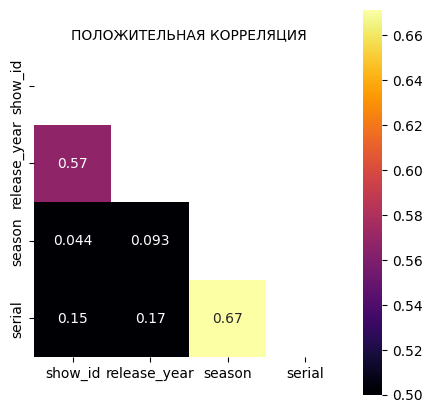

In [51]:
# ГРАФИК ПОЛОЖИТЕЛЬНОЙ КОРРЕЛЯЦИИ
fig, ax = plt.subplots(figsize=(5,5))
g = sns.heatmap(data=df_CORR, annot=True, ax=ax, square=True, vmin=0.5, cmap='inferno',
                # построение угла
                mask=np.triu(df_CORR)
                );
# заголовок
strtitle = "ПОЛОЖИТЕЛЬНАЯ КОРРЕЛЯЦИЯ"
g.set_title(label=strtitle, fontdict={'fontsize':10})

# сохранение графика
saveplot(fig=fig, strtitle=strtitle)

plt.show()

## **10.2. Тепловая карта агрегаторов**

    На графике подсвечены области для агрегаторов корреляции. Значения 'std' в диапазоне [41, 46] процентов указывают на примерно одинаковое распределение данных у выбранных параметров.

Файл 'images/Тепловая_Карта_Агрегаторов.png' сохранён


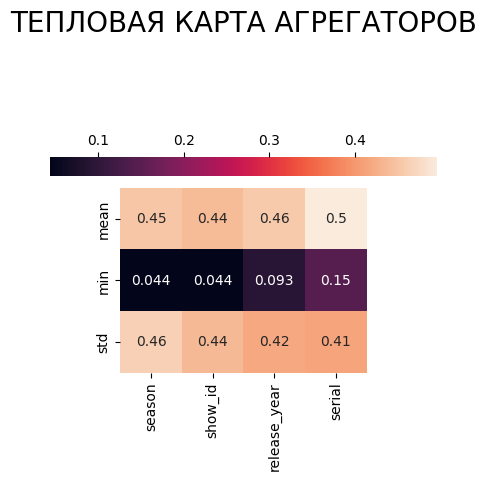

In [52]:
# ТЕПЛОВАЯ КАРТА АГРЕГАТОРОВ
fig, ax = plt.subplots(figsize=(5,3))
g = sns.heatmap(data=df_CORR_AGGREGTORS.T, annot=True, ax=ax, square=True,
                # параметры размещения тепловой шкалы
                cbar_kws={"orientation":"horizontal",
                          "location":"top"},
                )

# заголовок
strtitle = "ТЕПЛОВАЯ КАРТА АГРЕГАТОРОВ"
g.set_title(label=strtitle, fontdict={'fontsize':20}, y=1.8)

# сохранение графика
saveplot(fig=fig, strtitle=strtitle)
plt.show()

### **10.3. ПАРНЫЕ ГРАФИКИ**

Графики показывают кучность одних параметров в нижних диапазонах по количеству фильмов для каждой группы и аномально выбивающихся из основной массы других. Это происходит по причине отсутствующих данных для некоторых опций (например, не указано имя режиссёра, актёра).

На фоне других участников анализа по количеству причастности к фильму выделяются следующие лидеры: 
1. Редиссёры - Jan Suter.
2. Актёры - Anupam Kher,
3. Cтраны-производителей фильмов - 'United States',
4. Телеканалы - 'International Movies'.

На других графиках показана доля каждого из параметров от общего числа фильмов в исходном файле.

In [53]:
# данные для построения графиков
df_list = [df_DIRECTOR.query(f'name != "{np.nan}"'),
           df_ACTORS.query(f'name != "{np.nan}"'),
           df_COUNTRY.query(f'name != "{np.nan}"'),
           df_LISTED.query(f'name != "{np.nan}"')]

col_list=['director', 'actor', 'country', 'listed_in']

#### 10.3.1. ПОСТРОЕНИЕ ПАРНЫХ ГРАФИКОВ ПО КАТЕГОРИЯМ

Файл 'images\pairplot/Director.png' сохранён


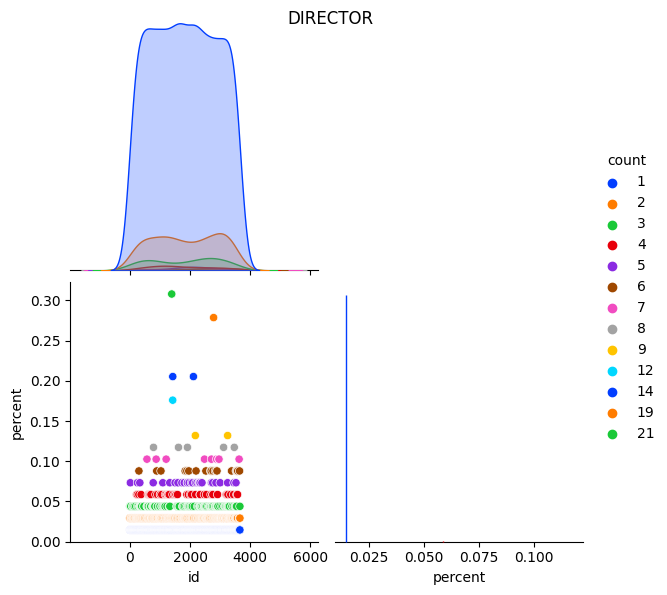

Файл 'images\pairplot/Actor.png' сохранён


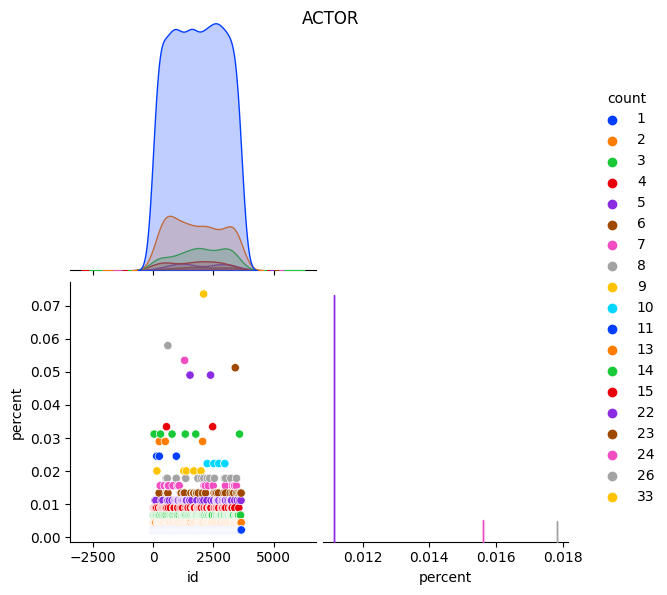

Файл 'images\pairplot/Country.png' сохранён


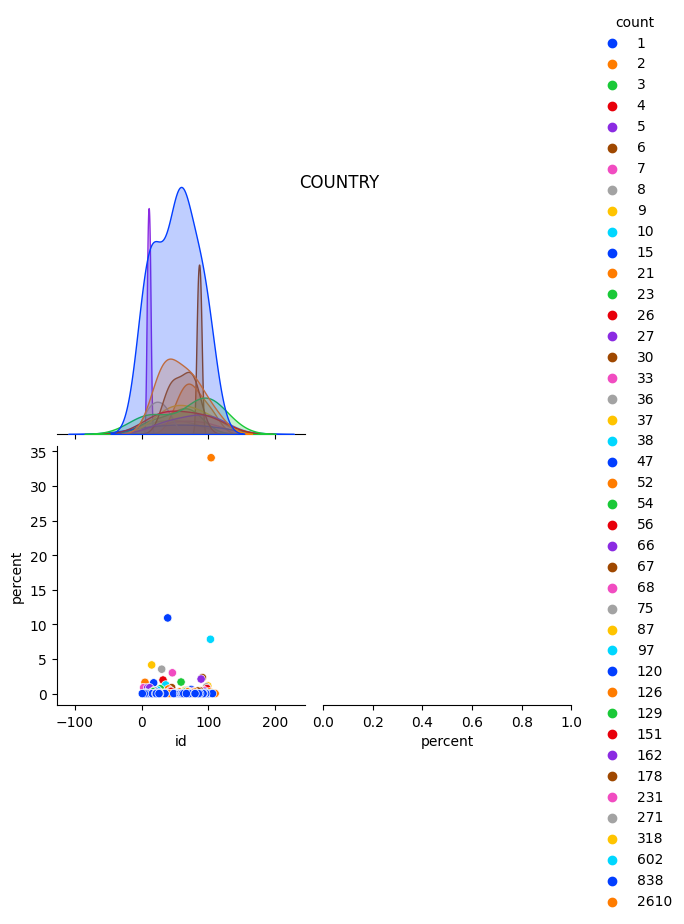

Файл 'images\pairplot/Listed_In.png' сохранён


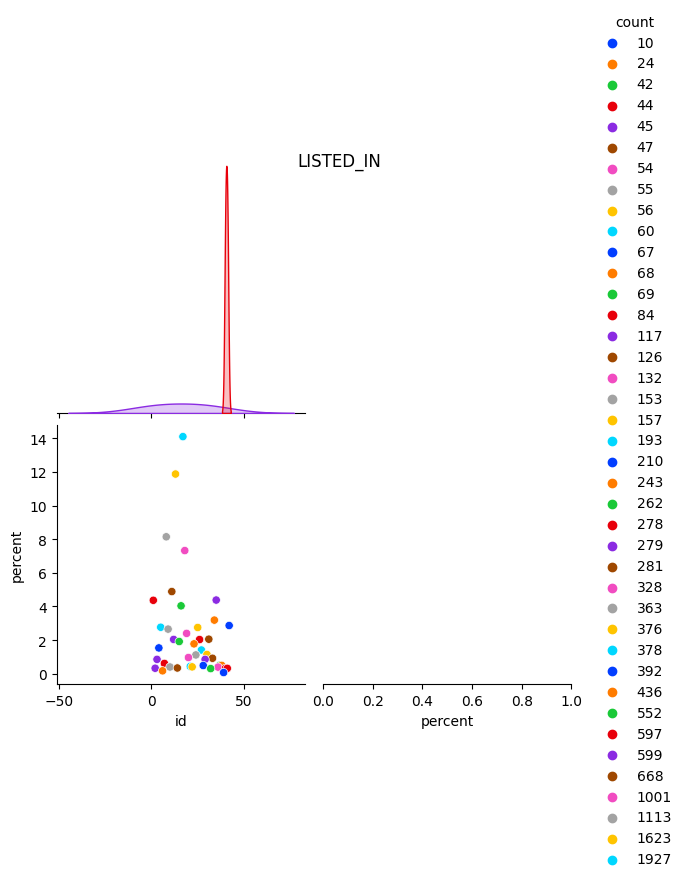

In [54]:
# ПОСТРОЕНИЕ ПАРНЫХ ГРАФИКОВ ПО КАТЕГОРИЯМ
draw_pairplot(df_list=df_list, strtitle=col_list)

#### 10.3.2. ОБЩАЯ ИНФОРМАЦИЯ ПО ГОДУ ВЫПУСКА И ВИДУ КАРТИНЫ
Основная часть фильмов это сериалы с большим количеством сезонов, (с пиком 3 сезона), выпущенные в 2000х. С увеличением численности сезонов количество фильмов падает, но удерживает большую долю.

У полнометражных картин тоже наблюдается рост числа с увеличением года выпуска.

Файл 'images\pairplot/Общая_Информация_По_Году_Выпуска_И_Виду_Картины.png' сохранён


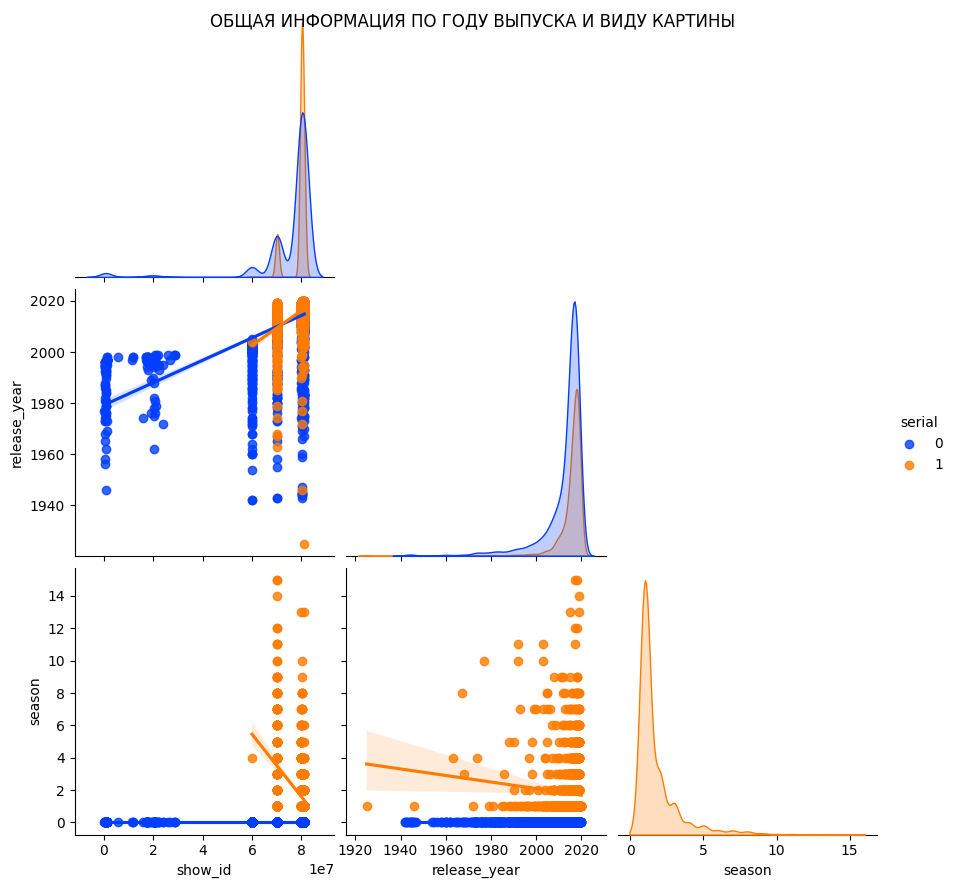

In [55]:
# ПОСТРОЕНИЕ ПАРНЫХ ГРАФИКОВ для ОБЩЕЙ ТАБЛИЦЫ
draw_pairplot(df_list=[df_MOVIE], strtitle=["ОБЩАЯ ИНФОРМАЦИЯ ПО ГОДУ ВЫПУСКА И ВИДУ КАРТИНЫ"],
              kind='reg', hue='serial', isDropna=False)

### 10.4. ДОЛЯ УЧАСТИЯ В ОБЩЕМ КОЛИЧЕСТВЕ ФИЛЬМОВ

Файл 'images/Доля_Участия_В_Общем_Количестве_Фильмов.png' сохранён


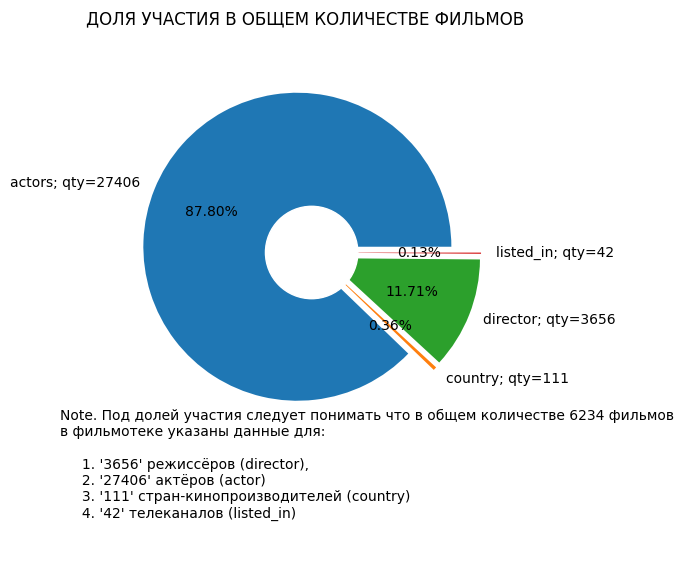

In [56]:
# ДОЛЯ УЧАСТИЯ В ОБЩЕМ КОЛИЧЕСТВЕ ФИЛЬМОВ
share_list = [df_ACTORS['id'].max(),
                df_COUNTRY['id'].max(),
                df_DIRECTOR['id'].max(),
                df_LISTED['id'].max()]

labels_list = ['actors', 'country', 'director', 'listed_in']

legend_dict = dict(zip(labels_list,share_list))

fig = plt.figure(figsize=(5,5))
g = plt.pie(x=share_list, explode=[0.1 for i in range(len(share_list))],
        labels=[f"{key}; qty={'{:.0f}'.format(legend_dict[key])}" for key in legend_dict],
        autopct='%1.2f%%'
        );

strtitle = "ДОЛЯ УЧАСТИЯ В ОБЩЕМ КОЛИЧЕСТВЕ ФИЛЬМОВ"
fig.suptitle(strtitle)

# fig.legend(labels=[f"{key}; {'{:.0f}'.format(legend_dict[key])} фильм" for key in legend_dict],
#            bbox_to_anchor=(0, 0, 0.5, 0))

        
# внутренний круг  
hole = plt.Circle((0, 0), 0.3, facecolor='white', edgecolor="white")
ax = plt.gcf().gca().add_artist(hole)

# Примечание
fig.text(s=f"Note. Под долей участия следует понимать что в общем количестве {df_MOVIE['title'].count()} фильмов\nв фильмотеке указаны данные для:\n\n" +
           f"     1. '{df_DIRECTOR['id'].max()}' режиссёров (director),\n" +
           f"     2. '{df_ACTORS['id'].max()}' актёров (actor)\n" +
           f"     3. '{df_COUNTRY['id'].max()}' стран-кинопроизводителей (country)\n" +
           f"     4. '{df_LISTED['id'].max()}' телеканалов (listed_in)\n\n",
         fontdict={'fontsize':10}, x=0.01, y=-0.1);

# сохранение графика
saveplot(fig=fig, strtitle=strtitle)
plt.show()

#### 10.5. ДОЛЯ УЧАСТИЯ В ОБЩЕМ КОЛИЧЕСТВЕ ФИЛЬМОВ

Файл 'images/Максимальное_Количество_Участников_В_Фильмах_И_Трансляциях.png' сохранён


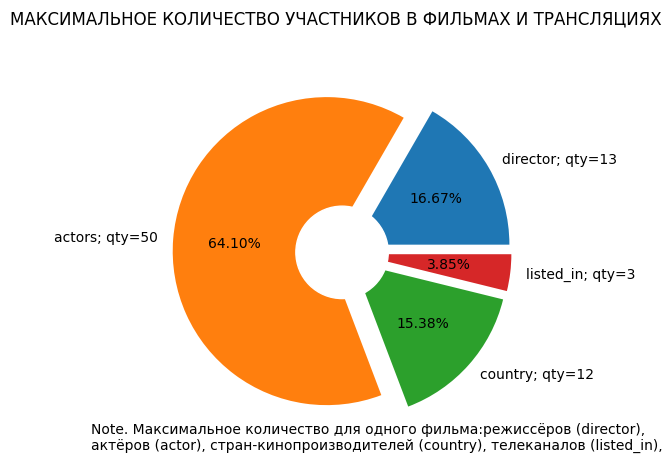

In [57]:
# ДОЛЯ УЧАСТИЯ В ОБЩЕМ КОЛИЧЕСТВЕ ФИЛЬМОВ
share_list_2 = [df_MOVIE['director_num'].astype(float).max(),
                df_MOVIE['cast_num'].astype(float).max(),
                df_MOVIE['country_num'].astype(float).max(),
                df_MOVIE['listed_in_num'].astype(float).max()]

labels_list_2 = ['director', 'actors', 'country', 'listed_in']

legend_dict_2 = dict(zip(labels_list_2,share_list_2))

fig = plt.figure(figsize=(5,5))
g = plt.pie(x=share_list_2, explode=[0.1 for i in range(len(share_list))],
        labels=[f"{key}; qty={'{:.0f}'.format(legend_dict_2[key])}" for key in legend_dict_2],
        autopct='%1.2f%%'
        );

strtitle = "МАКСИМАЛЬНОЕ КОЛИЧЕСТВО УЧАСТНИКОВ В ФИЛЬМАХ И ТРАНСЛЯЦИЯХ"
fig.suptitle(strtitle)

# fig.legend(labels=[f"{key}; {'{:.0f}'.format(legend_dict[key])} фильм" for key in legend_dict],
#            bbox_to_anchor=(0, 0, 0.5, 0))

        
# внутренний круг  
hole = plt.Circle((0, 0), 0.3, facecolor='white', edgecolor="white")
ax = plt.gcf().gca().add_artist(hole)

# Примечание
fig.text(s=f"Note. Максимальное количество для одного фильма:режиссёров (director),\nактёров (actor), стран-кинопроизводителей (country), телеканалов (listed_in),",
         fontdict={'fontsize':10}, x=0.01, y=0.1);

# сохранение графика
saveplot(fig=fig, strtitle=strtitle)
plt.show()

Информация по продолжительности фильма `'duration'` в минутах.

### **10.6. ДОЛЕВАЯ СТАТИСТИКА КАТЕГОРИЙ**

Файл 'images/Долевая_Статистика_Категорий.png' сохранён


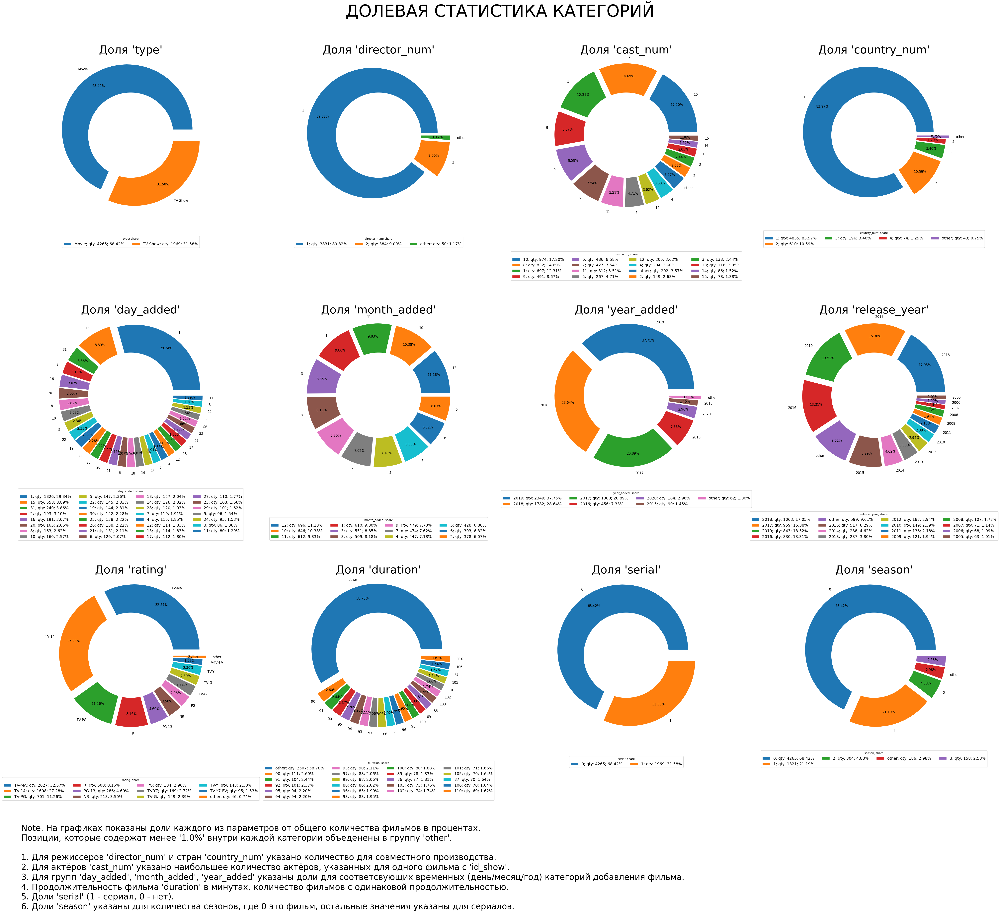

In [58]:
# ПОСТРОЕНИЕ ДОЛЕВОЙ СТАТИСТИКИ
# список столбцов для построения графика
col_list=[
        #   'show_id',
          'type',
        #   'title',
          'director_num',
        #   'cast',
          'cast_num',
          'country_num',
          'day_added',
          'month_added',
          'year_added',
          'release_year',
          'rating',
          'duration',
          'serial',
          'season'
          ]

plot_pie_grid_1(df_data=df_MOVIE, figsize=(50,50),
                  fontsize=60, y_title=1.01,
                  col_list=col_list,
                  ncol_legend=4,
                  w_pad=1, h_pad=2,
                  strtitle="ДОЛЕВАЯ СТАТИСТИКА КАТЕГОРИЙ",
                  strnote="Note. На графиках показаны доли каждого из параметров от общего количества фильмов в процентах.\n" +
                          "Позиции, которые содержат менее '1.0%' внутри каждой категории объеденены в группу 'other'.\n\n" +
                          "1. Для режиссёров 'director_num' и стран 'country_num' указано количество для совместного производства.\n" +
                          "2. Для актёров 'cast_num' указано наибольшее количество актёров, указанных для одного фильма с 'id_show'.\n" +
                          "3. Для групп 'day_added', 'month_added', 'year_added' указаны доли для соответсвующих временных (день/месяц/год) категорий добавления фильма.\n" +
                          "4. Продолжительность фильма 'duration' в минутах, количество фильмов с одинаковой продолжительностью.\n" +
                          "5. Доли 'serial' (1 - сериал, 0 - нет).\n" +
                          "6. Доли 'season' указаны для количества сезонов, где 0 это фильм, остальные значения указаны для сериалов.",
                    x_note=0.02, y_note=0.1, notesize=30,
                    isOther=True
                  )

### 10.7. КОЛИЧЕСТВО ФИЛЬМОВ ОДНОГО РЕЖИССЁРА

Файл 'images\quontity/Количество_Фильмов_Одного_Режиссёра.png' сохранён


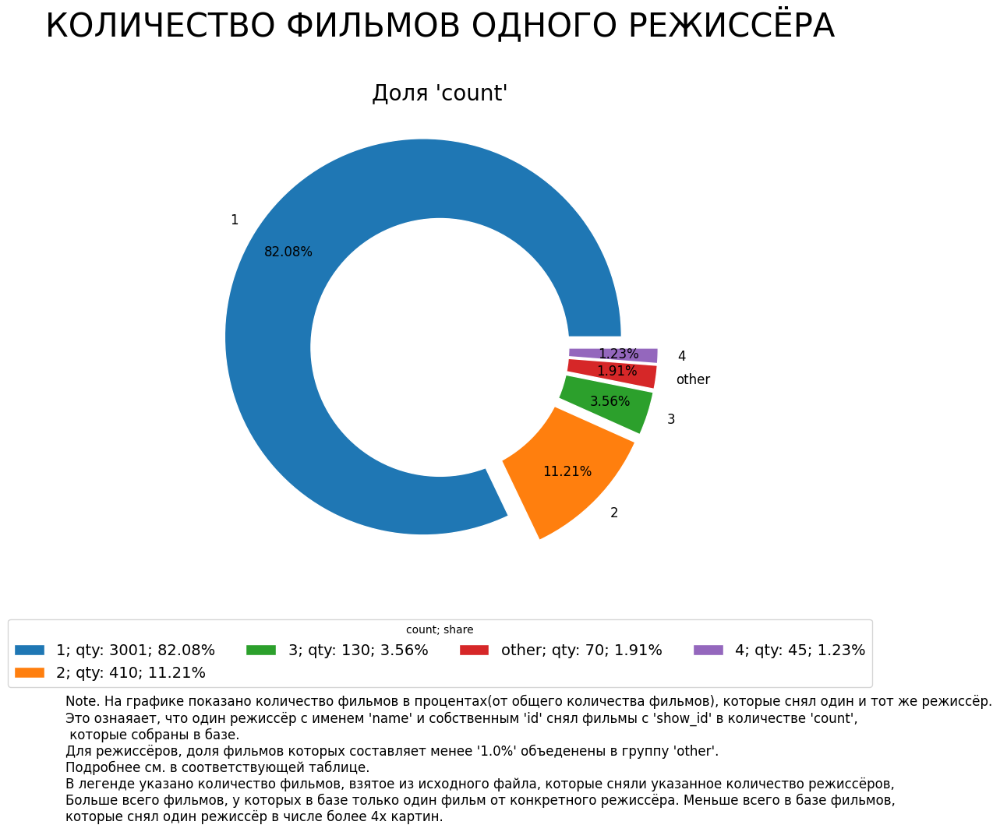

In [59]:
# ПОСТРОЕНИЕ ДОЛЕВОЙ СТАТИСТИКИ - КОЛИЧЕСТВО ФИЛЬМОВ ОДНОГО РЕЖИССЁРА
plot_pie_grid_1(df_data=df_DIRECTOR, figsize=(10,9),
                  fontsize=30, y_title=1.01,
                  threshold_percent=1,
                  col_list=['count'],
                  ncol_legend=4,
                  w_pad=1, h_pad=0.01,
                  strtitle="КОЛИЧЕСТВО ФИЛЬМОВ ОДНОГО РЕЖИССЁРА",
                  strnote="Note. На графике показано количество фильмов в процентах(от общего количества фильмов), которые снял один и тот же режиссёр.\n" +
                          "Это ознаяает, что один режиссёр с именем 'name' и собственным 'id' снял фильмы с 'show_id' в количестве 'count',\n которые собраны в базе.\n" +
                          "Для режиссёров, доля фильмов которых составляет менее '1.0%' объеденены в группу 'other'.\n" +
                          "Подробнее см. в соответствующей таблице.\n" +
                          "В легенде указано количество фильмов, взятое из исходного файла, которые сняли указанное количество режиссёров,\n" +
                          "Больше всего фильмов, у которых в базе только один фильм от конкретного режиссёра. Меньше всего в базе фильмов,\nкоторые снял один режиссёр в числе более 4х картин.",
                    x_note=0.02, y_note=-0.15, notesize=12, titlesize=20, subfolder='quontity'
                  )

Файл 'images\quontity/Количество_Фильмов_Одного_Режиссёра-2.png' сохранён


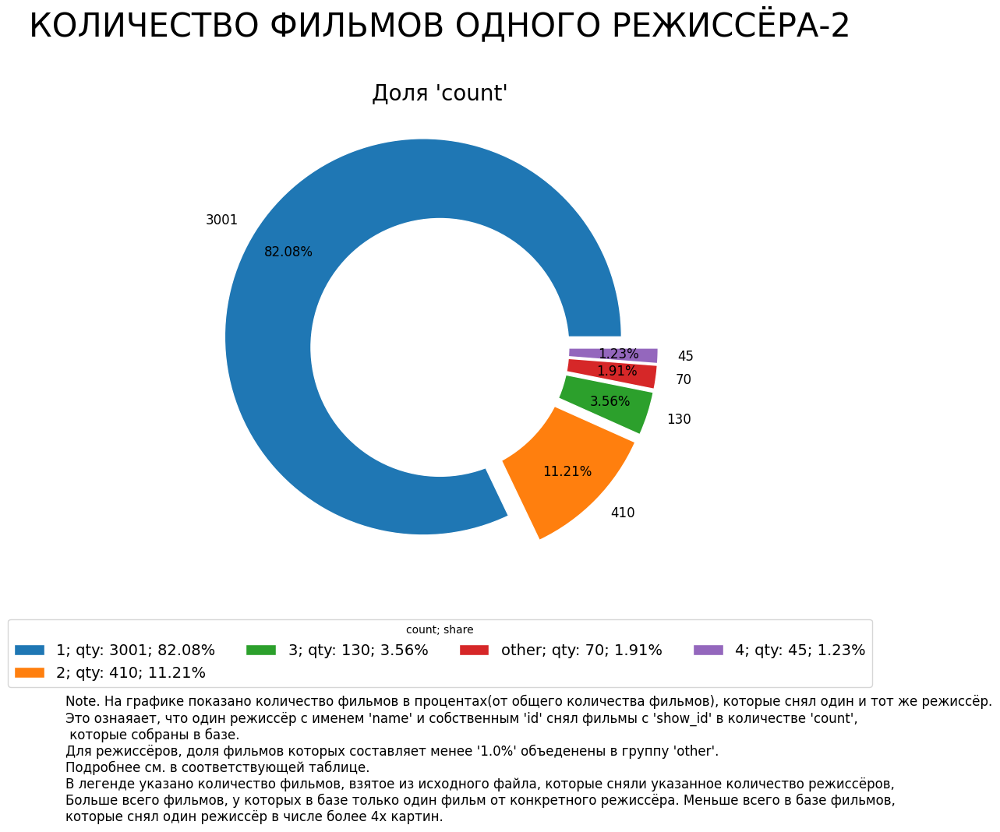

In [60]:
# ПОСТРОЕНИЕ ДОЛЕВОЙ СТАТИСТИКИ - КОЛИЧЕСТВО ФИЛЬМОВ ОДНОГО РЕЖИССЁРА
plot_pie_grid_1(df_data=df_DIRECTOR.dropna(), figsize=(10,9),
                  fontsize=30, y_title=1.01,
                  threshold_percent=1,
                  col_list=['count'],
                  ncol_legend=4,
                  w_pad=1, h_pad=0.01,
                  strtitle="КОЛИЧЕСТВО ФИЛЬМОВ ОДНОГО РЕЖИССЁРА-2",
                  strnote="Note. На графике показано количество фильмов в процентах(от общего количества фильмов), которые снял один и тот же режиссёр.\n" +
                          "Это ознаяает, что один режиссёр с именем 'name' и собственным 'id' снял фильмы с 'show_id' в количестве 'count',\n которые собраны в базе.\n" +
                          "Для режиссёров, доля фильмов которых составляет менее '1.0%' объеденены в группу 'other'.\n" +
                          "Подробнее см. в соответствующей таблице.\n" +
                          "В легенде указано количество фильмов, взятое из исходного файла, которые сняли указанное количество режиссёров,\n" +
                          "Больше всего фильмов, у которых в базе только один фильм от конкретного режиссёра. Меньше всего в базе фильмов,\nкоторые снял один режиссёр в числе более 4х картин.",
                    x_note=0.02, y_note=-0.15, notesize=12, titlesize=20, subfolder='quontity',
                    isNamesinLabels=True
                  )

In [61]:
df_ACTORS.sort_values(by='percent', ascending=False).head()

,id,name,show_id,count,percent,director_id
27311,27312,nan,"296682,1064058,1151375,17016471,17457962,17969...",570,1.270025,NaN
2090,2091,Anupam Kher,"17457622,17969262,60002111,60003401,60021906,6...",33,0.073528,81057249
22900,22901,Shah Rukh Khan,"17671454,20717860,20764666,24081514,60000722,6...",30,0.066843,NaN
18174,18175,Naseeruddin Shah,"60021548,60034116,70000196,70006866,70042756,7...",27,0.060159,NaN
19052,19053,Om Puri,"20077944,60022962,60032008,60037397,70001237,7...",27,0.060159,NaN


### 10.8. КОЛИЧЕСТВО ФИЛЬМОВ ОДНОГО АКТЁРА

Файл 'images\quontity/Количество_Фильмов_Одного_Актёра.png' сохранён


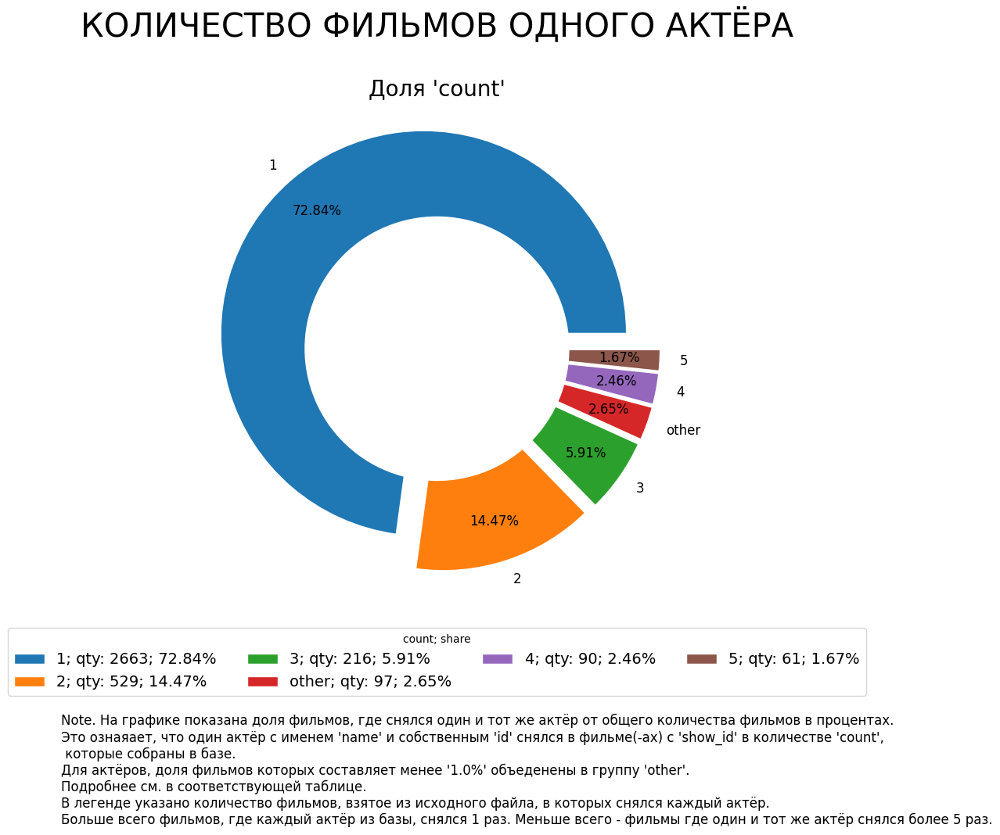

In [62]:
# ПОСТРОЕНИЕ ДОЛЕВОЙ СТАТИСТИКИ - КОЛИЧЕСТВО ФИЛЬМОВ ОДНОГО АКТЁРА
plot_pie_grid_1(df_data=df_ACTORS.dropna(), figsize=(10,9),
                  fontsize=30, y_title=1.01,
                  col_list=['count'],
                  ncol_legend=4,
                  w_pad=1, h_pad=0.01,
                  strtitle="КОЛИЧЕСТВО ФИЛЬМОВ ОДНОГО АКТЁРА",
                  strnote="Note. На графике показана доля фильмов, где снялся один и тот же актёр от общего количества фильмов в процентах.\n" +
                          "Это ознаяает, что один актёр с именем 'name' и собственным 'id' снялся в фильме(-ах) с 'show_id' в количестве 'count',\n которые собраны в базе.\n" +
                          "Для актёров, доля фильмов которых составляет менее '1.0%' объеденены в группу 'other'.\n" +
                          "Подробнее см. в соответствующей таблице.\n" +
                          "В легенде указано количество фильмов, взятое из исходного файла, в которых снялся каждый актёр.\n" +
                          "Больше всего фильмов, где каждый актёр из базы, снялся 1 раз. Меньше всего - фильмы где один и тот же актёр снялся более 5 раз.",
                    x_note=0.02, y_note=-0.15, notesize=12, titlesize=20, subfolder='quontity'
                  )

Файл 'images\quontity/Количество_Фильмов_Одного_Актёра-2.png' сохранён


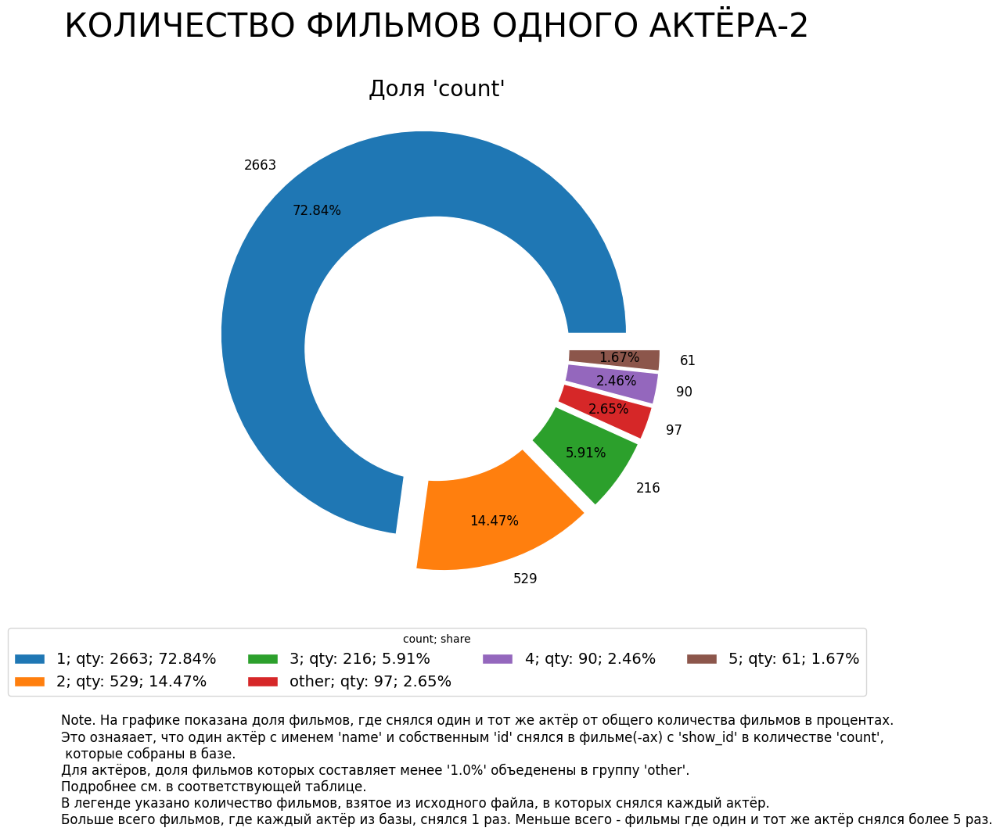

In [63]:
# ПОСТРОЕНИЕ ДОЛЕВОЙ СТАТИСТИКИ - КОЛИЧЕСТВО ФИЛЬМОВ ОДНОГО АКТЁРА
plot_pie_grid_1(df_data=df_ACTORS.dropna(), figsize=(10,9),
                  fontsize=30, y_title=1.01,
                  col_list=['count'],
                  ncol_legend=4,
                  w_pad=1, h_pad=0.01,
                  strtitle="КОЛИЧЕСТВО ФИЛЬМОВ ОДНОГО АКТЁРА-2",
                  strnote="Note. На графике показана доля фильмов, где снялся один и тот же актёр от общего количества фильмов в процентах.\n" +
                          "Это ознаяает, что один актёр с именем 'name' и собственным 'id' снялся в фильме(-ах) с 'show_id' в количестве 'count',\n которые собраны в базе.\n" +
                          "Для актёров, доля фильмов которых составляет менее '1.0%' объеденены в группу 'other'.\n" +
                          "Подробнее см. в соответствующей таблице.\n" +
                          "В легенде указано количество фильмов, взятое из исходного файла, в которых снялся каждый актёр.\n" +
                          "Больше всего фильмов, где каждый актёр из базы, снялся 1 раз. Меньше всего - фильмы где один и тот же актёр снялся более 5 раз.",
                    x_note=0.02, y_note=-0.15, notesize=12, titlesize=20, subfolder='quontity',
                    isNamesinLabels=True
                  )

### 10.9. КОЛИЧЕСТВО ФИЛЬМОВ ОДНОГО ИЗ ОДНОЙ СТРАНЫ

Файл 'images\quontity/Количество_Фильмов_Из_Одной_Страны.png' сохранён


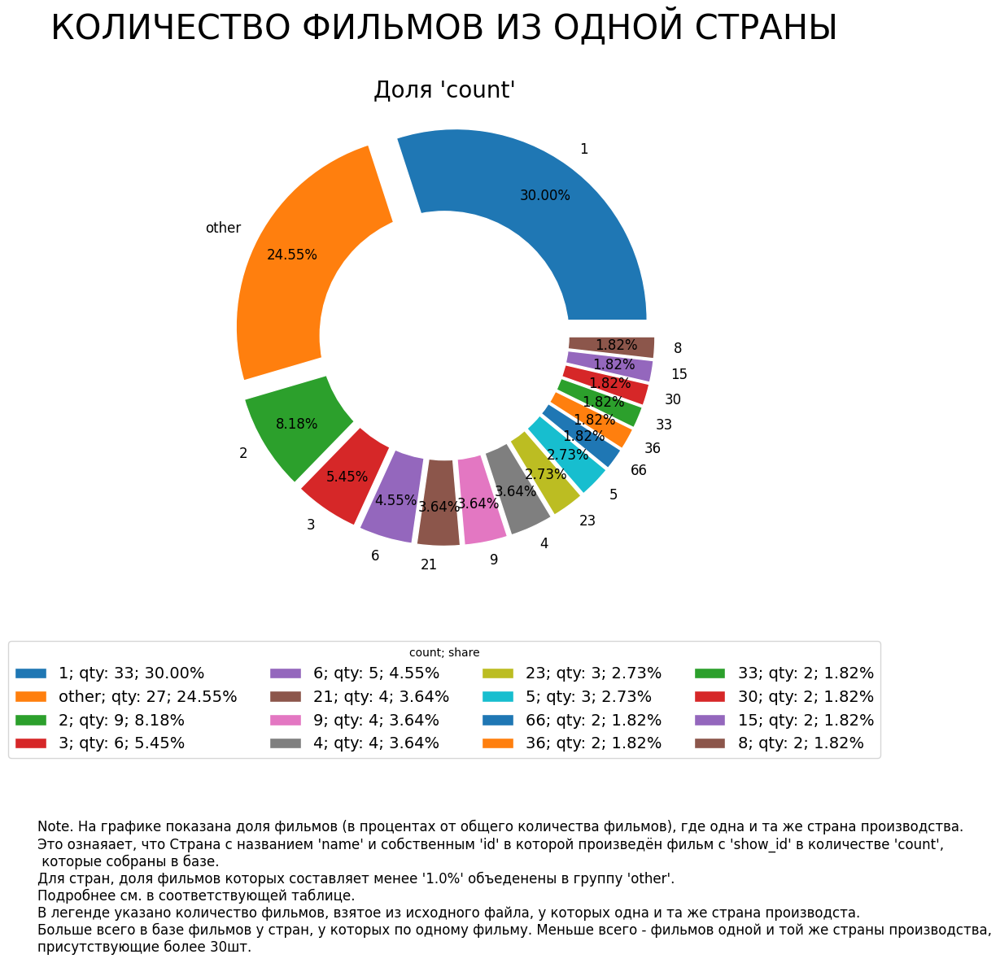

In [64]:
# ПОСТРОЕНИЕ ДОЛЕВОЙ СТАТИСТИКИ - КОЛИЧЕСТВО ФИЛЬМОВ ИЗ ОДНОЙ СТРАНЫ
plot_pie_grid_1(df_data=df_COUNTRY.dropna(), figsize=(10,10),
                  fontsize=30, y_title=1.01,
                  col_list=['count'],
                  ncol_legend=4,
                  w_pad=1, h_pad=0.01,
                  strtitle="КОЛИЧЕСТВО ФИЛЬМОВ ИЗ ОДНОЙ СТРАНЫ",
                  strnote="Note. На графике показана доля фильмов (в процентах от общего количества фильмов), где одна и та же страна производства.\n" +
                          "Это ознаяает, что Страна с названием 'name' и собственным 'id' в которой произведён фильм с 'show_id' в количестве 'count',\n которые собраны в базе.\n" +
                          "Для стран, доля фильмов которых составляет менее '1.0%' объеденены в группу 'other'.\n" +
                          "Подробнее см. в соответствующей таблице.\n" +
                          "В легенде указано количество фильмов, взятое из исходного файла, у которых одна и та же страна производста.\n" +
                          "Больше всего в базе фильмов у стран, у которых по одному фильму. Меньше всего - фильмов одной и той же страны производства,\nприсутствующие более 30шт.",
                    x_note=0, y_note=-0.15, notesize=12, titlesize=20, subfolder='quontity'
                  )

Файл 'images\quontity/Количество_Фильмов_Из_Одной_Страны-2.png' сохранён


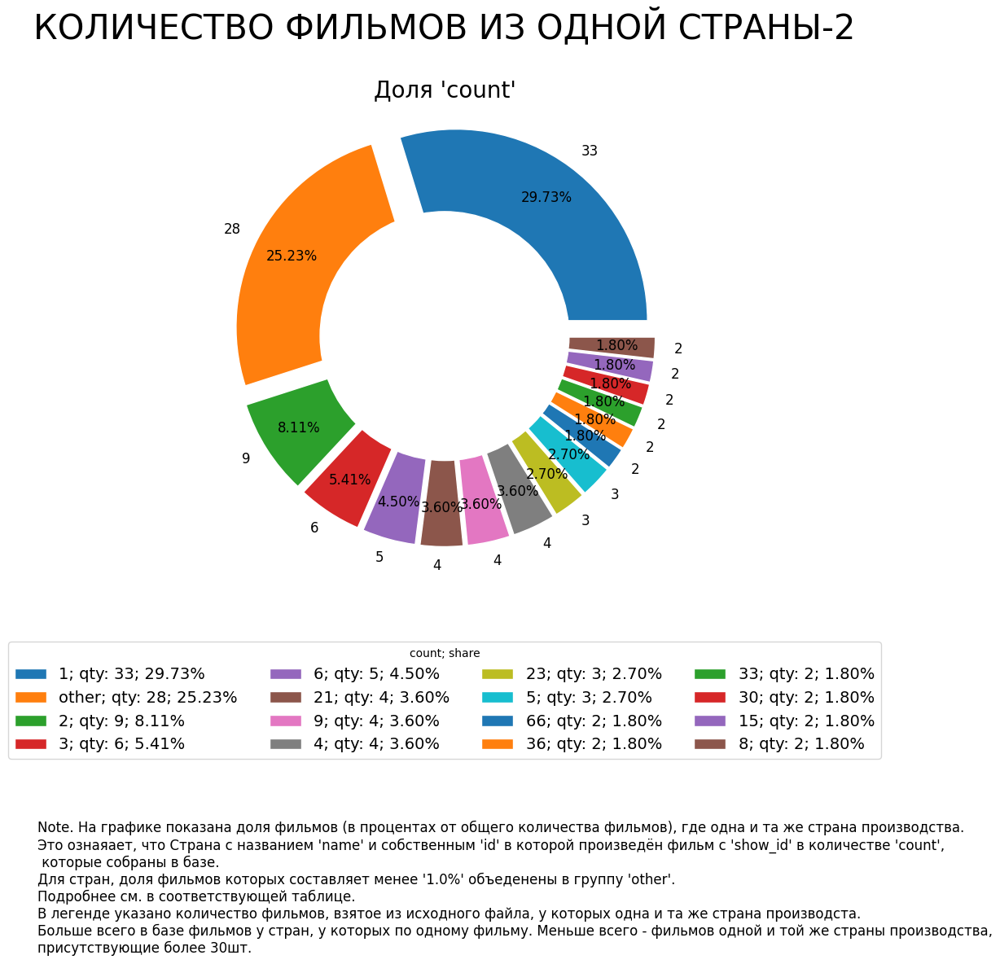

In [65]:
# ПОСТРОЕНИЕ ДОЛЕВОЙ СТАТИСТИКИ - КОЛИЧЕСТВО ФИЛЬМОВ ИЗ ОДНОЙ СТРАНЫ
plot_pie_grid_1(df_data=df_COUNTRY, figsize=(10,10),
                  fontsize=30, y_title=1.01,
                  col_list=['count'],
                  ncol_legend=4,
                  w_pad=1, h_pad=0.01,
                  strtitle="КОЛИЧЕСТВО ФИЛЬМОВ ИЗ ОДНОЙ СТРАНЫ-2",
                  strnote="Note. На графике показана доля фильмов (в процентах от общего количества фильмов), где одна и та же страна производства.\n" +
                          "Это ознаяает, что Страна с названием 'name' и собственным 'id' в которой произведён фильм с 'show_id' в количестве 'count',\n которые собраны в базе.\n" +
                          "Для стран, доля фильмов которых составляет менее '1.0%' объеденены в группу 'other'.\n" +
                          "Подробнее см. в соответствующей таблице.\n" +
                          "В легенде указано количество фильмов, взятое из исходного файла, у которых одна и та же страна производста.\n" +
                          "Больше всего в базе фильмов у стран, у которых по одному фильму. Меньше всего - фильмов одной и той же страны производства,\nприсутствующие более 30шт.",
                    x_note=0, y_note=-0.15, notesize=12, titlesize=20, subfolder='quontity',
                    isNamesinLabels=True
                  )

### 10.10. КОЛИЧЕСТВО ФИЛЬМОВ НА ТЕЛЕКАНАЛАХ

Файл 'images\quontity/Количество_Фильмов_На_Телеканалах.png' сохранён


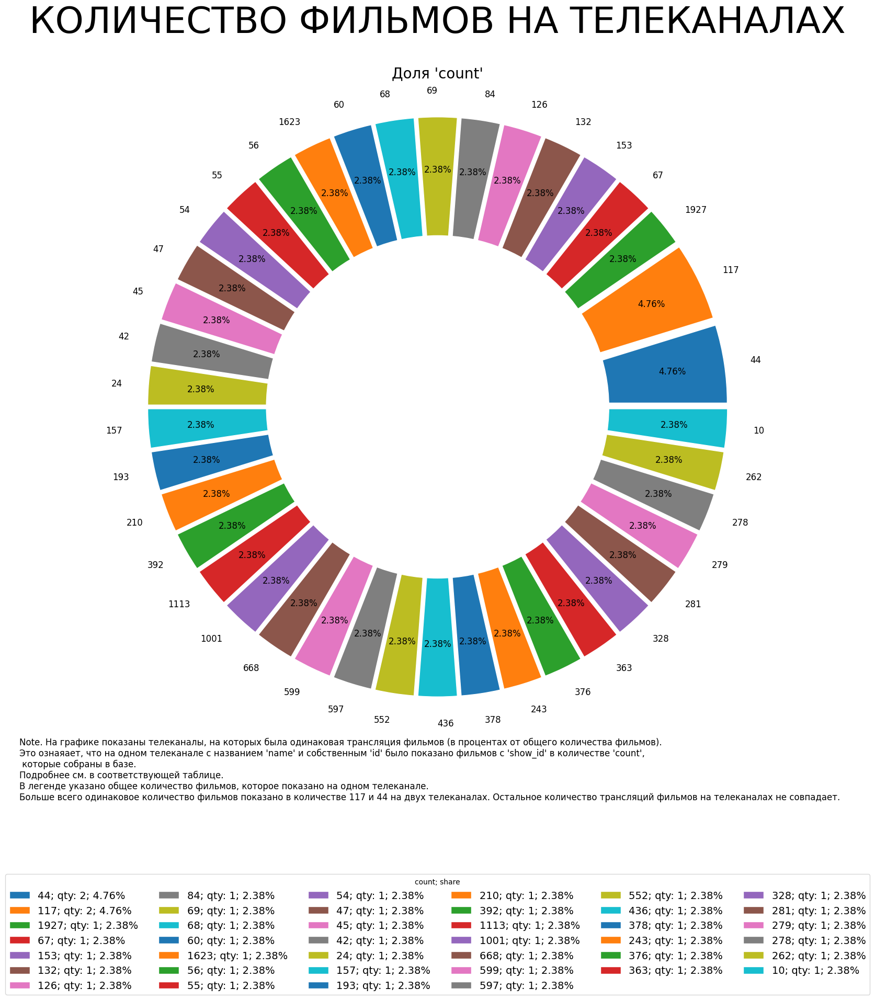

In [66]:
# ПОСТРОЕНИЕ ДОЛЕВОЙ СТАТИСТИКИ - КОЛИЧЕСТВО ФИЛЬМОВ НА ТЕЛЕКАНАЛАХ
plot_pie_grid_1(df_data=df_LISTED.dropna(), figsize=(20,20),
                  fontsize=50, y_title=1.01,
                  col_list=['count'],
                  ncol_legend=6,
                  threshold_percent=2,
                  w_pad=1, h_pad=0.01,
                  strtitle="КОЛИЧЕСТВО ФИЛЬМОВ НА ТЕЛЕКАНАЛАХ",
                  strnote="Note. На графике показаны телеканалы, на которых была одинаковая трансляция фильмов (в процентах от общего количества фильмов).\n" +
                          "Это ознаяает, что на одном телеканале с названием 'name' и собственным 'id' было показано фильмов с 'show_id' в количестве 'count',\n которые собраны в базе.\n" +
                          # "Для стран, доля фильмов которых составляет менее '1.0%' объеденены в группу 'other'.\n" +
                          "Подробнее см. в соответствующей таблице.\n" +
                          "В легенде указано общее количество фильмов, которое показано на одном телеканале.\n" +
                          "Больше всего одинаковое количество фильмов показано в количестве 117 и 44 на двух телеканалах. Остальное количество трансляций фильмов на телеканалах не совпадает.",
                    x_note=0.1, y_note=0.25, notesize=12, titlesize=20, subfolder='quontity'
                  )

Файл 'images\quontity/Количество_Фильмов_На_Телеканалах-2.png' сохранён


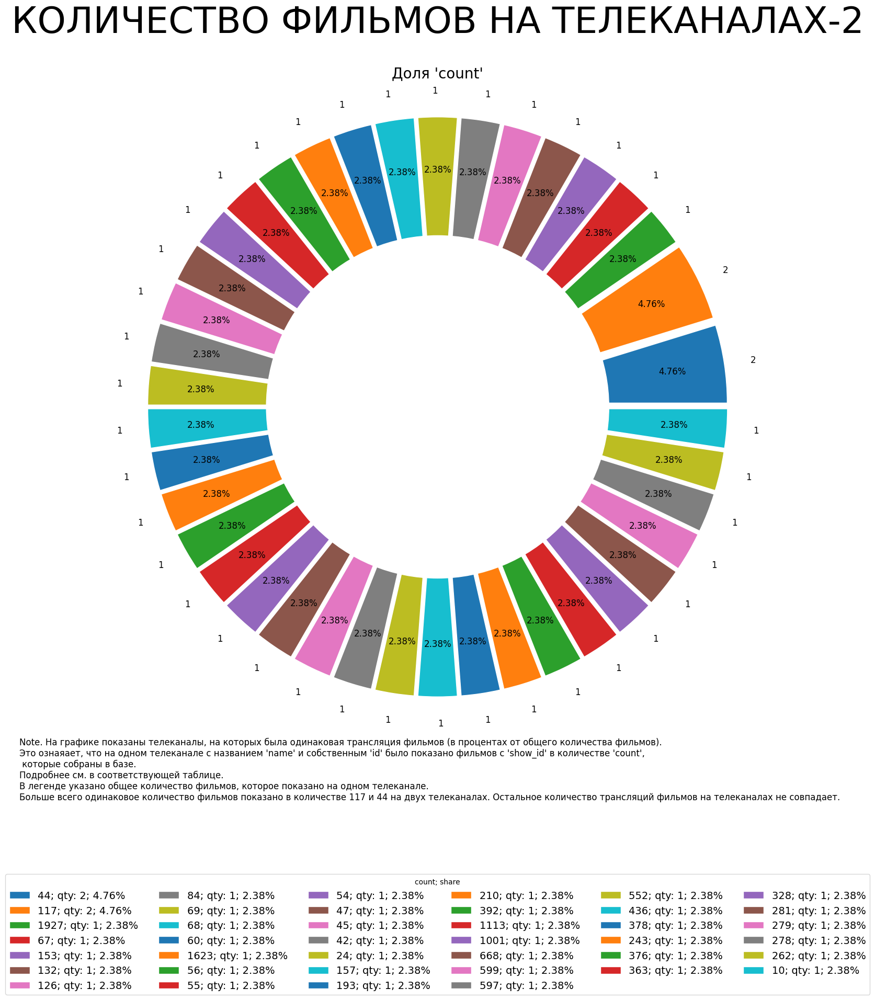

In [67]:
# ПОСТРОЕНИЕ ДОЛЕВОЙ СТАТИСТИКИ - КОЛИЧЕСТВО ФИЛЬМОВ НА ТЕЛЕКАНАЛАХ
plot_pie_grid_1(df_data=df_LISTED, figsize=(20,20),
                  fontsize=50, y_title=1.01,
                  col_list=['count'],
                  ncol_legend=6,
                  threshold_percent=2,
                  w_pad=1, h_pad=0.01,
                  strtitle="КОЛИЧЕСТВО ФИЛЬМОВ НА ТЕЛЕКАНАЛАХ-2",
                  strnote="Note. На графике показаны телеканалы, на которых была одинаковая трансляция фильмов (в процентах от общего количества фильмов).\n" +
                          "Это ознаяает, что на одном телеканале с названием 'name' и собственным 'id' было показано фильмов с 'show_id' в количестве 'count',\n которые собраны в базе.\n" +
                          # "Для стран, доля фильмов которых составляет менее '1.0%' объеденены в группу 'other'.\n" +
                          "Подробнее см. в соответствующей таблице.\n" +
                          "В легенде указано общее количество фильмов, которое показано на одном телеканале.\n" +
                          "Больше всего одинаковое количество фильмов показано в количестве 117 и 44 на двух телеканалах. Остальное количество трансляций фильмов на телеканалах не совпадает.",
                    x_note=0.1, y_note=0.25, notesize=12, titlesize=20, subfolder='quontity',
                    isNamesinLabels=True
                  )

### 10.11. РЕЙТИНГ ПЕРВЫХ 5 СТРОК ПО КОЛИЧЕСТВУ ФИЛЬМОВ

Файл 'images\top/Рейтинг_Первых_5_Строк_По_Количеству_Фильмов.png' сохранён


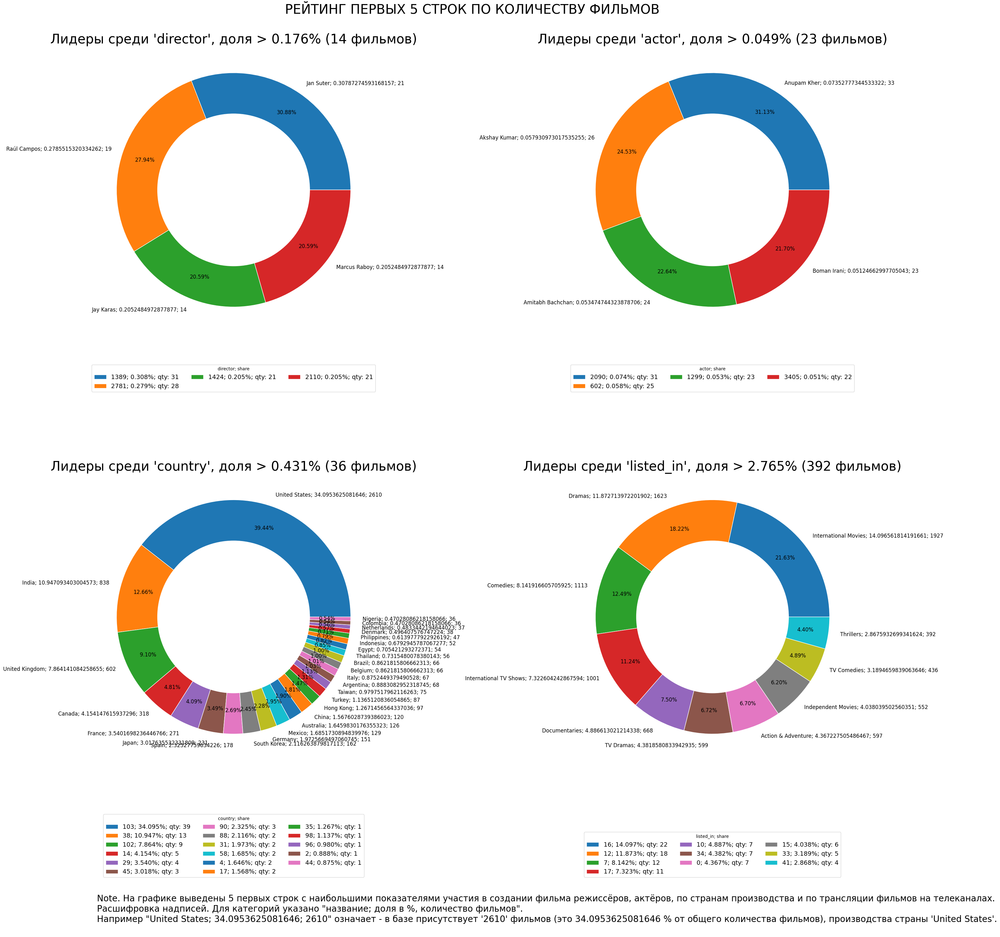

In [68]:
# ПОСТРОЕНИЕ ГРАФИКА - РЕЙТИНГ ПЕРВЫХ 5 СТРОК ПО КОЛИЧЕСТВУ ФИЛЬМОВ
plot_pie_grid_2(df_list=[df_DIRECTOR.query(f'name != "{np.nan}"'),
                             df_ACTORS.query(f'name != "{np.nan}"'),
                             df_COUNTRY.query(f'name != "{np.nan}"'),
                             df_LISTED.query(f'name != "{np.nan}"')],
                    # figsize=(5,5),
                    strtitle="РЕЙТИНГ ПЕРВЫХ 5 СТРОК ПО КОЛИЧЕСТВУ ФИЛЬМОВ",
                    col_list=['director', 'actor', 'country', 'listed_in'],
                    column_name = "percent",
                    threshold_percent_rows=5,
                    titlesize=30,                    
                    strnote="Note. На графике выведены 5 первых строк с наибольшими показателями участия в создании фильма режиссёров, актёров, по странам производства и по трансляции фильмов на телеканалах.\n" +
                            "Расшифровка надписей. Для категорий указано \"название; доля в %, количество фильмов\".\n" +
                            "Например \"United States; 34.0953625081646; 2610\" означает - в базе присутствует '2610' фильмов (это 34.0953625081646 % от общего количества фильмов), производства страны 'United States'.\n",
                    notesize=20, y_note=-0.01,
                    ncol_legend=3, subfolder='top'
                    )

### 10.12. РЕЙТИНГ ПОСЛЕДНИХ 10 СТРОК ПО КОЛИЧЕСТВУ ФИЛЬМОВ

Файл 'images\top/Рейтинг_Последних_5_Строк_По_Количеству_Фильмов.png' сохранён


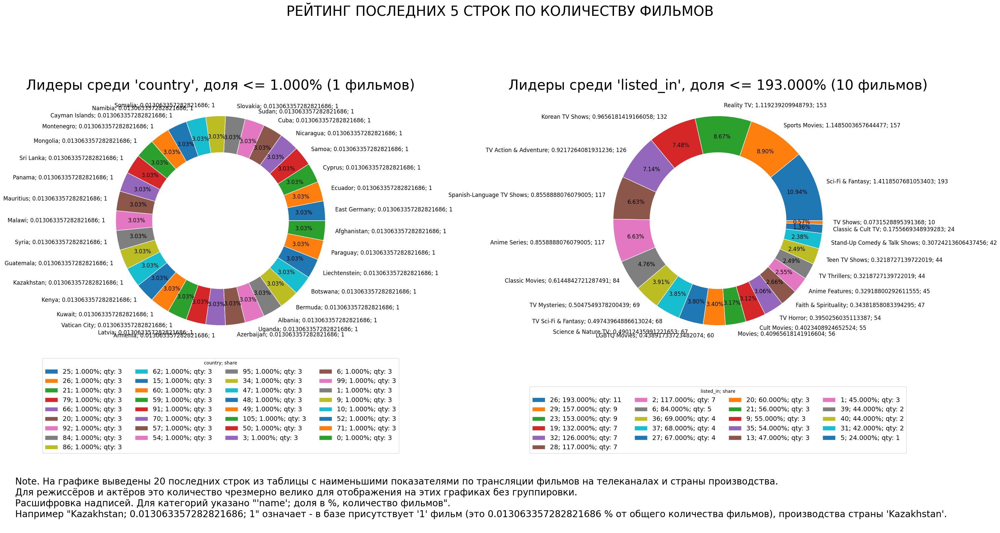

In [69]:
# ПОСТРОЕНИЕ ГРАФИКА - РЕЙТИНГ ПОСЛЕДНИХ 5 СТРОК ПО КОЛИЧЕСТВУ ФИЛЬМОВ
plot_pie_grid_2(df_list=[df_COUNTRY, df_LISTED],
                    # figsize=(5,5),
                    strtitle="РЕЙТИНГ ПОСЛЕДНИХ 5 СТРОК ПО КОЛИЧЕСТВУ ФИЛЬМОВ",
                    col_list=['country', 'listed_in'],
                    column_name = "count",
                    threshold_percent=0.03,
                    threshold_percent_rows=-10,
                    kind="<=",
                    titlesize=30,
                    strnote="Note. На графике выведены 20 последних строк из таблицы с наименьшими показателями по трансляции фильмов на телеканалах и страны производства.\n" +
                            "Для режиссёров и актёров это количество чрезмерно велико для отображения на этих графиках без группировки.\n" +
                            "Расшифровка надписей. Для категорий указано \"'name'; доля в %, количество фильмов\".\n" +                            
                            "Например \"Kazakhstan; 0.013063357282821686; 1\" означает - в базе присутствует '1' фильм (это 0.013063357282821686 % от общего количества фильмов), производства страны 'Kazakhstan'.\n",
                    notesize=20, x_note=0.01, y_note=0.45,
                    ncol_legend=4, subfolder='top'
                    )

### **10.13. ГРАФИКИ РАСПРЕДЕЛЕНИЯ ПАРАМЕТРОВ**

    На графиках показано распределение основных данных в пределах [min,max] для каждой пары параметров.

#### 10.13.1. ПАРНЫЕ ГРАФИКИ СОСТАВЛЯЮЩИХ ПАРАМЕТРОВ ФИЛЬМОТЕКИ

Файл 'images\pairplot/Парные_Графики_Составляющих_Параметров_Фильмотеки.png' сохранён


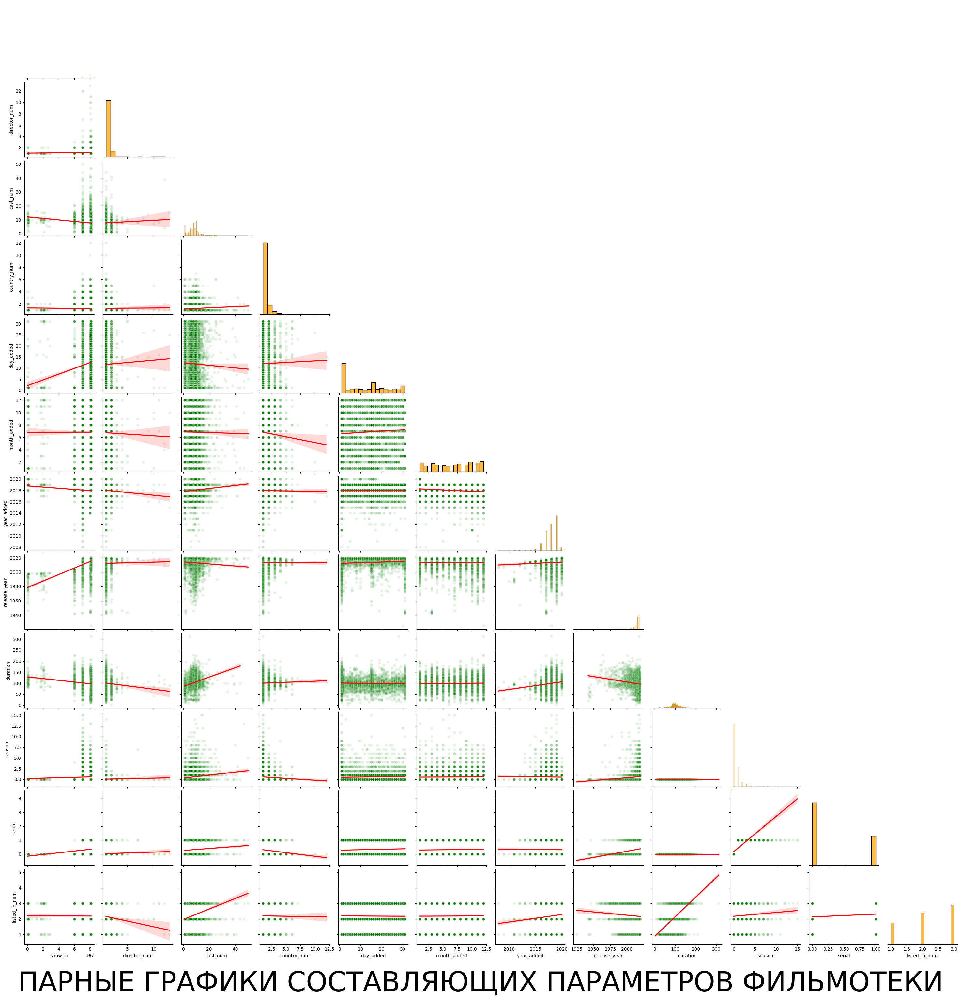

In [70]:
# ПАРНЫЕ ГРАФИКИ СОСТАВЛЯЮЩИХ ПАРАМЕТРОВ ФИЛЬМОТЕКИ
draw_pairplot_2(df_data=load_file(file='./data/netflix_titles_cleared.csv'), strtitle="ПАРНЫЕ ГРАФИКИ СОСТАВЛЯЮЩИХ ПАРАМЕТРОВ ФИЛЬМОТЕКИ", isShow=True, subfolder='pairplot')

#### 10.13.2. NAN-ПАРНЫЕ ГРАФИКИ СОСТАВЛЯЮЩИХ ПАРАМЕТРОВ ФИЛЬМОТЕКИ

Файл 'images\pairplot/Nan-Парные_Графики_Составляющих_Параметров_Фильмотеки.png' сохранён


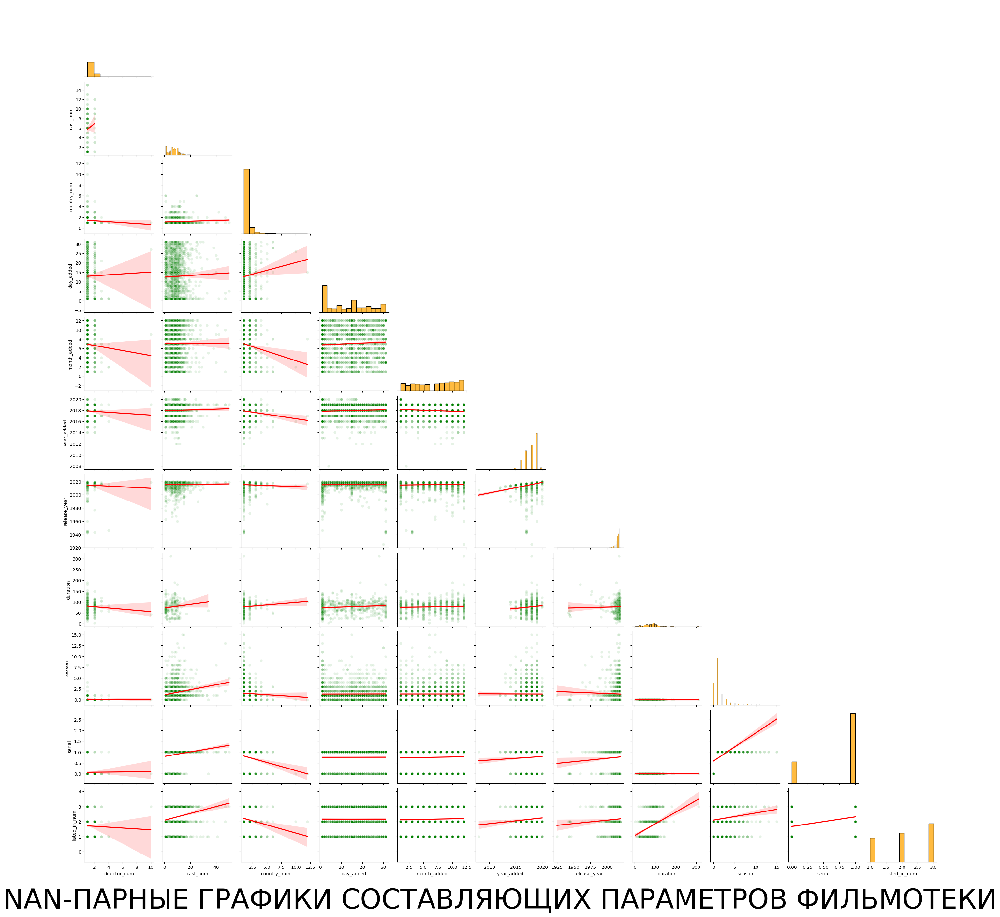

In [71]:
# ПАРНЫЕ ГРАФИКИ СОСТАВЛЯЮЩИХ ПАРАМЕТРОВ АРЕНДЫ
draw_pairplot_2(df_data=load_file(file='./data/nan_netflix_titles_cleared.csv'), strtitle="NAN-ПАРНЫЕ ГРАФИКИ СОСТАВЛЯЮЩИХ ПАРАМЕТРОВ ФИЛЬМОТЕКИ", isShow=True, subfolder='pairplot')

# **11. РЕЗЮМЕ**

В данной работе сделана первичная визуальная оценка таблиц и графиков. Выводы и заключения оформлены в каждом разделе, по мере очистки и анализа данных, а так же на самих графиках. По причине наличия более глубокого анализа данных здесь показаны не все возможности.

Детально ознакомиться с графиками в хорошем качестве и сводными таблицами анализа можно в каталогах:

1. `"./data"`
2. `"./images"`
